# Make gene usage correlation with deconvolution values

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
from scipy.stats import spearmanr

In [3]:
data = pd.read_csv('~/tcga_airr_compiled.txt.gz', sep='\t')

meta = pd.read_csv('~/tcga_metadata.tsv', sep='\t')
meta = meta.drop(columns=['file_name', 'file_path', 'sample_id', 'normal', 'cancer', 'PASS']) # удалим колонки, которые задублированны
meta = meta.drop_duplicates() # и теперь дублирующиеся строки
data = pd.merge(data, meta, left_on='sample', right_on='submitter_id')
data.head(3)

In [3]:
deconv = pd.read_csv('CIBERSORT-ABS_dec.csv')
deconv = deconv.set_index('cell_type')
print(deconv.shape)
deconv.head(3)

(9718, 22)


,B cell naive,B cell memory,B cell plasma,T cell CD8+,T cell CD4+ naive,T cell CD4+ memory resting,T cell CD4+ memory activated,T cell follicular helper,T cell regulatory (Tregs),T cell gamma delta,...,Monocyte,Macrophage M0,Macrophage M1,Macrophage M2,Myeloid dendritic cell resting,Myeloid dendritic cell activated,Mast cell activated,Mast cell resting,Eosinophil,Neutrophil
cell_type,,,,,,,,,,,,,,,,,,,,,
TCGA-OR-A5J1,0.000552,0.000429,0.000000,0.021223,0.000000,0.039226,0.0,0.003787,0.009358,0.0,...,0.018473,0.000000,0.000000,0.071280,0.0,0.002659,0.011477,0.000000,0.00032,0.0
TCGA-OR-A5J2,0.013554,0.000000,0.044274,0.021486,0.000000,0.024412,0.0,0.016756,0.000000,0.0,...,0.006484,0.012895,0.005895,0.120971,0.0,0.009007,0.000000,0.002818,0.00000,0.0
TCGA-OR-A5J3,0.007283,0.000000,0.022736,0.001968,0.007245,0.016556,0.0,0.000000,0.000000,0.0,...,0.004296,0.000000,0.000000,0.026180,0.0,0.018127,0.005667,0.000000,0.00000,0.0


## Correlations with `TRA` and `TRB` locuses only

We use **Spearman correlation** from the `stats` package to also get **p-values**.  
We'll convert the data into **long-format matrices**, concatenate them by name, and then, from the resulting **all-vs-all matrices**, we'll extract the subset matching the original dataframes to obtain a rectangular table.  

**NB!** In the clustermap, some unexpected **IGH** entries from `j_call` were being pulled in (which shouldn't be there). I modified the filtering approach to exclude them.

Lets try normalization on `duplicate_count` and nubmer of samples

In [10]:
a = data[(data['locus'] == 'TRA') & (data['v_call'].str.contains('TRA')) & (data['j_call'].str.contains('TRA'))]

In [11]:
sample_sums = a.groupby('sample')['duplicate_count'].sum()

# v_call count with duplicate_count and normalization
counts_v = (
    uvm.groupby(['sample', 'v_call'])['duplicate_count']
    .sum()
    .div(sample_sums)  # divide on an all sample count for each sample
    .reset_index()
    .pivot(index='sample', columns='v_call', values='duplicate_count')
    .fillna(0)
)

counts_v.head(2)

In [14]:
def dec_corr_TRA_TRB_heatmap(cancer: pd.DataFrame, deconvoluted: pd.DataFrame, cancer_name: str, TR="TRA"):
    """
    Building a correlation clustermap between deconvolution and TCR (TRA or TRB) data

    Parameters:
    - cancer: DataFrame containing TCR data (TRA and TRB)  
    - deconvoluted: DataFrame with deconvolution data  
    - cancer_name: Cancer type name (for title)  
    - TR: String specifying data type ("TRA" or "TRB"). Default: "TRA" 
    """
    if TR == "TRA":
        # new filtration          
        uvm = cancer[(cancer['locus'] == 'TRA') & (cancer['v_call'].str.contains('TRA')) & (cancer['j_call'].str.contains('TRA'))]
        sample_sums = uvm.groupby('sample')['duplicate_count'].sum()
        counts_v = (
            uvm.groupby(['sample', 'v_call'])['duplicate_count']
            .sum()
            .div(sample_sums)
            .reset_index()
            .pivot(index='sample', columns='v_call', values='duplicate_count')
            .fillna(0)
        )
        counts_j = (
            uvm.groupby(['sample', 'j_call'])['duplicate_count']
            .sum()
            .div(sample_sums)
            .reset_index()
            .pivot(index='sample', columns='j_call', values='duplicate_count')
            .fillna(0)
        )
        title_suffix = "TRA"
    elif TR == "TRB":
        uvm = cancer[(cancer['locus'] == 'TRB') & (cancer['v_call'].str.contains('TRB')) & (cancer['j_call'].str.contains('TRB'))]
        sample_sums = uvm.groupby('sample')['duplicate_count'].sum()
        
        counts_v = (
            uvm.groupby(['sample', 'v_call'])['duplicate_count']
            .sum()
            .div(sample_sums)
            .reset_index()
            .pivot(index='sample', columns='v_call', values='duplicate_count')
            .fillna(0))
        
        counts_j = (
            uvm.groupby(['sample', 'j_call'])['duplicate_count']
            .sum()
            .div(sample_sums)
            .reset_index()
            .pivot(index='sample', columns='j_call', values='duplicate_count')
            .fillna(0))
        
        title_suffix = "TRB"


    # unite V and J genes
    tr_vj = pd.merge(counts_v, counts_j, on='sample', how='inner')

    dec_numeric = deconvoluted.set_index("cell_type").select_dtypes(include=['number'])
    tr_numeric = tr_vj.select_dtypes(include=['number'])

    common_samples = dec_numeric.index.intersection(tr_numeric.index)
    dec_numeric = dec_numeric.loc[common_samples]
    tr_numeric = tr_numeric.loc[common_samples]
    dec_numeric = dec_numeric.loc[~dec_numeric.index.duplicated(keep='first')]

    merged_df = pd.concat([dec_numeric, tr_numeric], axis=1, join="inner")

    corr_matrix, p_value_matrix = spearmanr(merged_df)
    corr_df = pd.DataFrame(corr_matrix, index=merged_df.columns, columns=merged_df.columns)
    p_value_df = pd.DataFrame(p_value_matrix, index=merged_df.columns, columns=merged_df.columns)

    filtered_corr = corr_df.loc[dec_numeric.columns, tr_numeric.columns]
    filtered_pv = p_value_df.loc[dec_numeric.columns, tr_numeric.columns]

    # p-values mask
    pval_mask = filtered_pv >= 0.05
    corr_mask = np.abs(filtered_corr) < 0.5
    final_mask = pval_mask | corr_mask
    
    pallete = sns.color_palette("Spectral", as_cmap=True)
    filtered_corr_masked = filtered_corr.copy()
    filtered_corr_masked[final_mask] = np.nan

    high_corr_df = (filtered_corr_masked.stack().reset_index()    
    .rename(columns={
        'level_0': 'Cell',    
        'level_1': 'Gene',    
        0: 'Correlation'})
    .dropna()         
    .assign(          
        TCGA_id=cancer_name,  
        TR=TR                  
    )
    [['TCGA_id', 'TR', 'Gene', 'Cell', 'Correlation']]  
    .sort_values('Correlation', key=abs, ascending=False) 
    .reset_index(drop=True))
    
    
    g = sns.clustermap(
        filtered_corr_masked,
        cmap=pallete,
        vmin=-1, vmax=1,  
        annot=False,
        fmt=".1f",      
        linewidths=0.3,   
        linecolor='black', 
        mask=final_mask,
        figsize=(24, 14), 
        cbar_pos=(-0.04, 0.8, 0.01, 0.15),  
        dendrogram_ratio=(.015, .025),  
        square=False,
        row_cluster=False,  
    col_cluster=False   
    )
    g.ax_heatmap.set_facecolor("white")
    g.fig.suptitle(f"Clustermap {cancer_name} {title_suffix} with CIBERSORT-ABS deconvoluted cells pv>0.05 cor>0.5", y=1.05, fontsize=27, fontweight="bold")
    plt.setp(g.ax_heatmap.get_xticklabels(), fontsize=22)  # Подписи по оси X
    plt.setp(g.ax_heatmap.get_yticklabels(), fontsize=22)  # Подписи по оси Y
    save_path = f'./pics/{cancer_name}-{title_suffix}-ABS_norm-deconv-cor.png'
    g.savefig(save_path, dpi=50, bbox_inches='tight')  # 
    plt.show()
    
    return high_corr_df

Try 1 before cycle

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


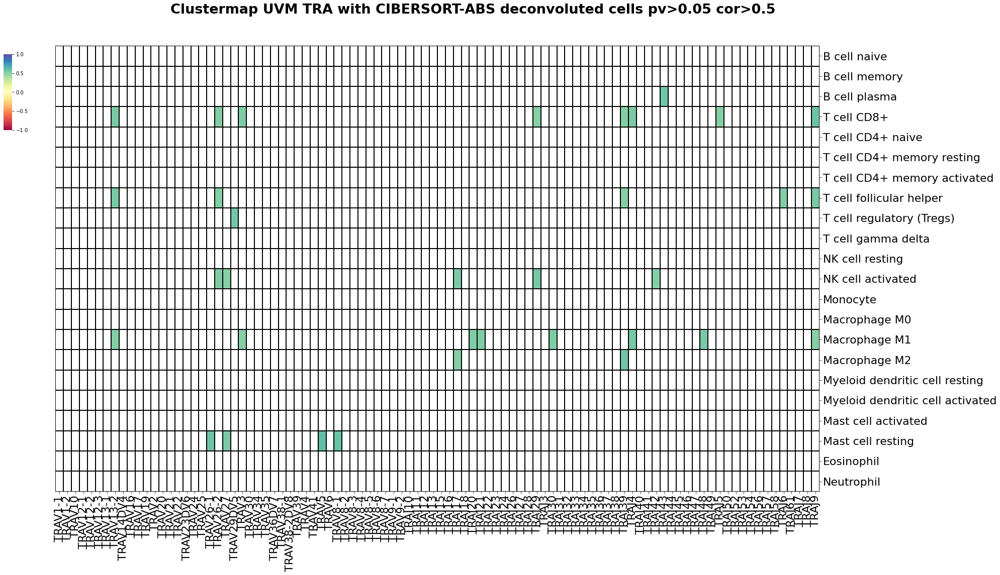

,TCGA_id,TR,Gene,Cell,Correlation
0,UVM,TRA,TRAV5,Mast cell resting,0.612594
1,UVM,TRA,TRAV8-1,Mast cell resting,0.587457
2,UVM,TRA,TRAJ9,T cell CD8+,0.584767
3,UVM,TRA,TRAV26-1,Mast cell resting,0.573432
4,UVM,TRA,TRAJ39,Macrophage M2,0.566308
5,UVM,TRA,TRAJ43,B cell plasma,0.564278
6,UVM,TRA,TRAV29DV5,T cell regulatory (Tregs),0.555543
7,UVM,TRA,TRAJ4,Macrophage M1,0.551225
8,UVM,TRA,TRAJ29,NK cell activated,0.547611
9,UVM,TRA,TRAJ48,Macrophage M1,0.542038


In [15]:
a = dec_corr_TRA_TRB_heatmap(uvm, deconv, cancer_name="UVM", TR="TRA")
a

## Compute correlations

In [16]:
cancer_types = data.project_id.unique().tolist()
print(cancer_types)

['TCGA-GBM', 'TCGA-OV', 'TCGA-LUAD', 'TCGA-LUSC', 'TCGA-PRAD', 'TCGA-UCEC', 'TCGA-BLCA', 'TCGA-TGCT', 'TCGA-ESCA', 'TCGA-PAAD', 'TCGA-KIRP', 'TCGA-LIHC', 'TCGA-CESC', 'TCGA-SARC', 'TCGA-BRCA', 'TCGA-THYM', 'TCGA-MESO', 'TCGA-COAD', 'TCGA-STAD', 'TCGA-SKCM', 'TCGA-CHOL', 'TCGA-KIRC', 'TCGA-THCA', 'TCGA-HNSC', 'TCGA-LAML', 'TCGA-READ', 'TCGA-LGG', 'TCGA-DLBC', 'TCGA-KICH', 'TCGA-UCS', 'TCGA-ACC', 'TCGA-PCPG', 'TCGA-UVM']


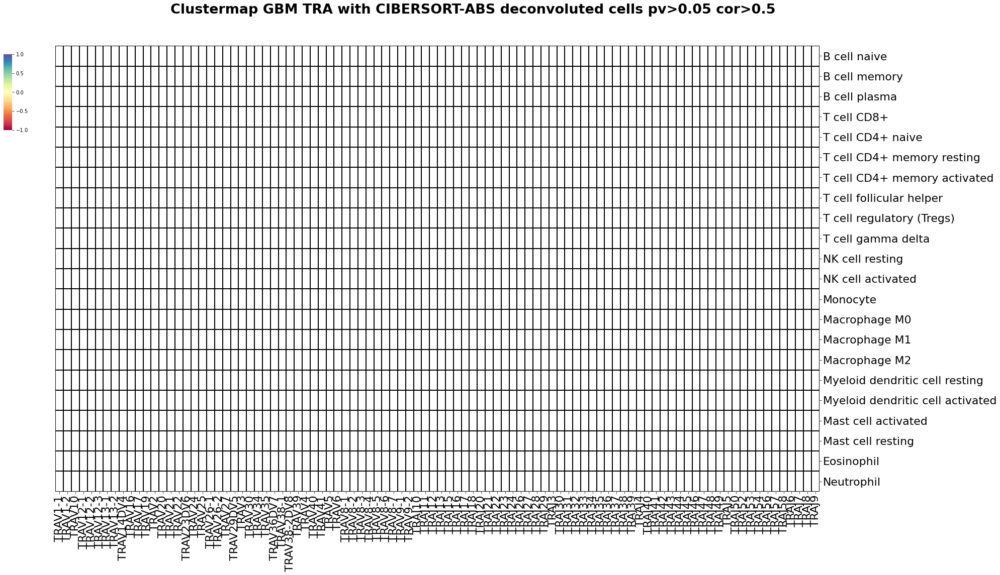

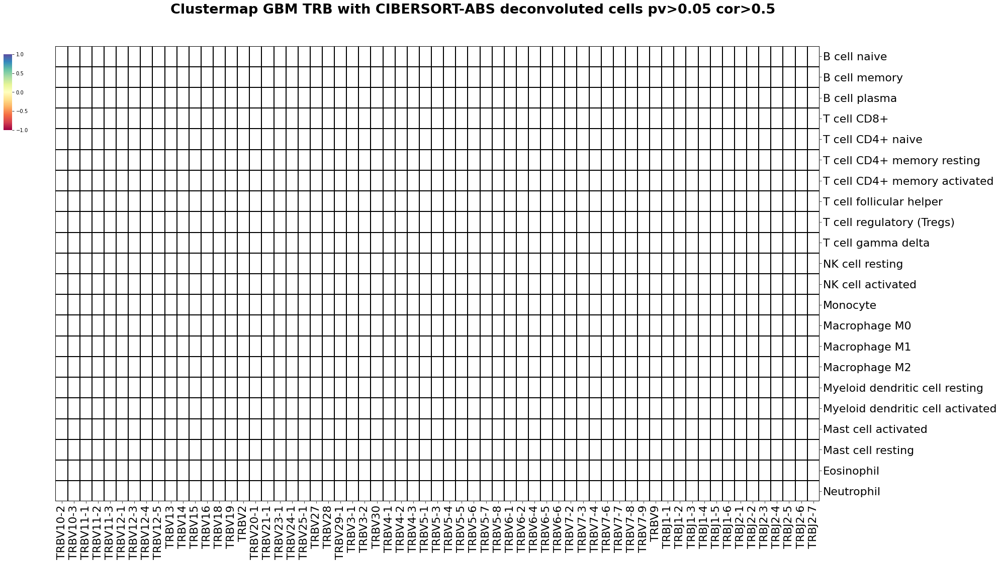

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


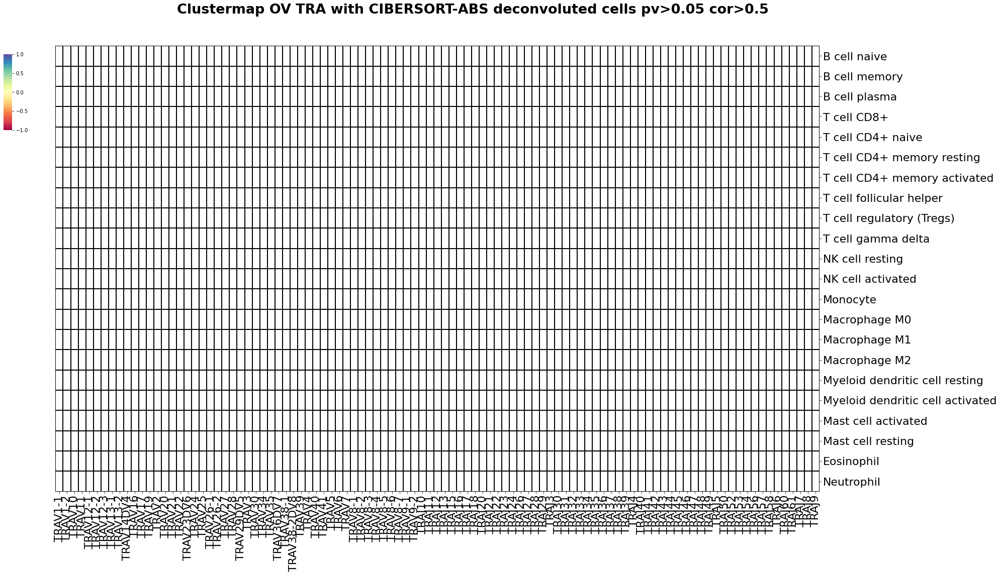

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


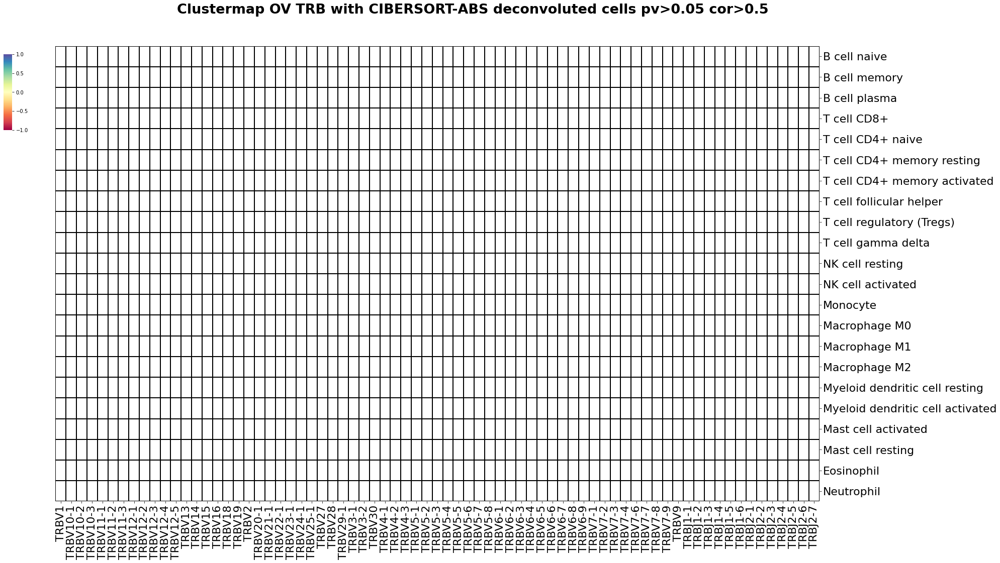

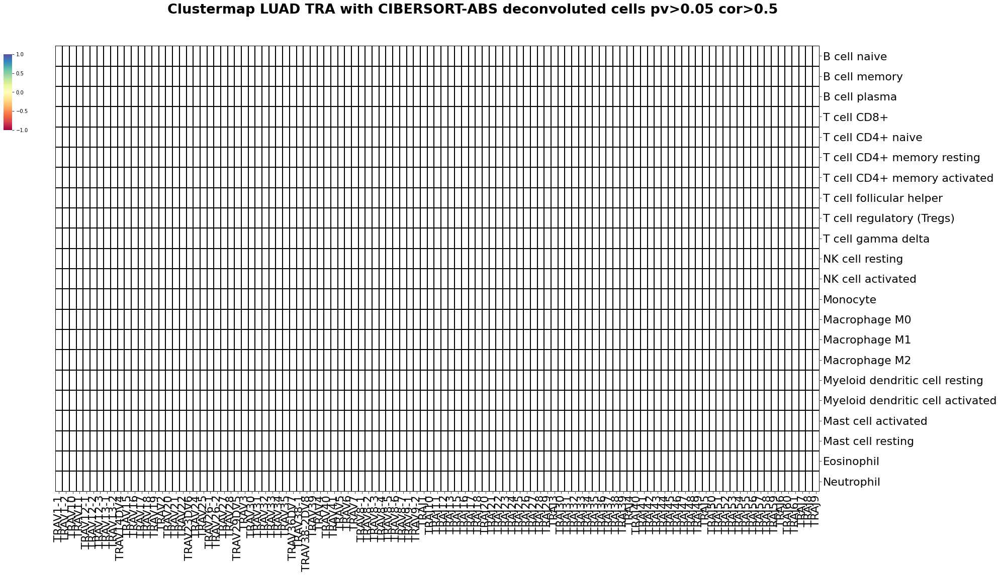

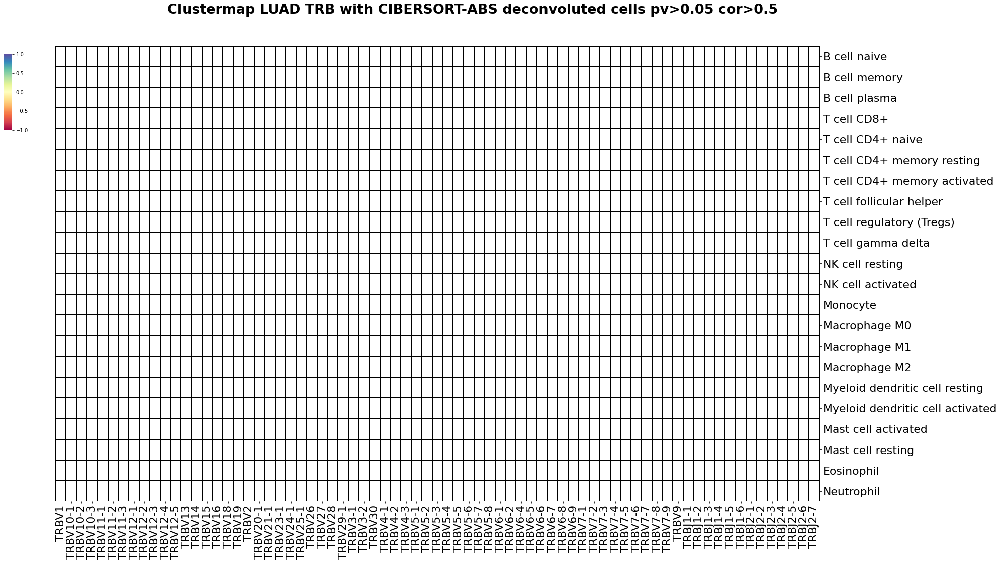

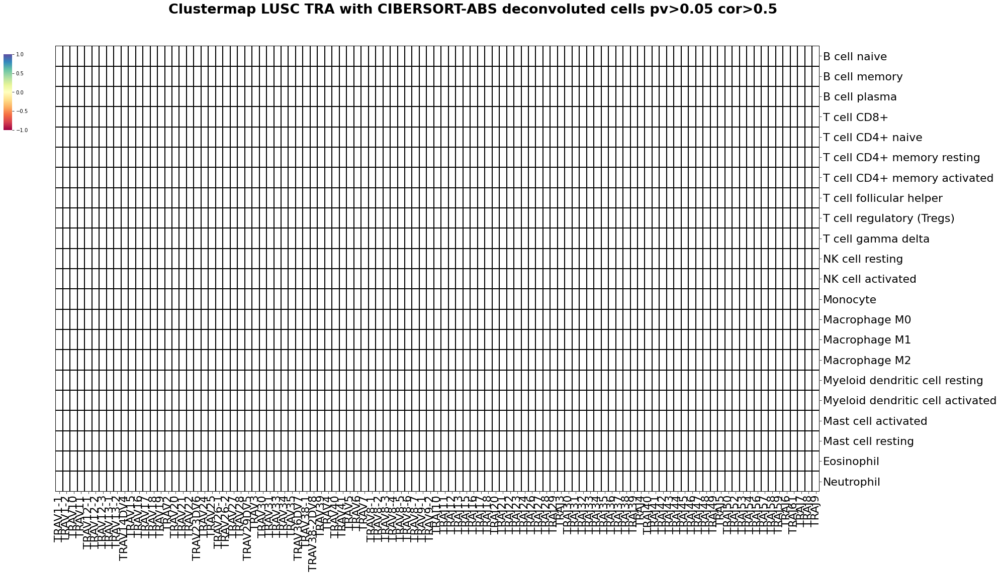

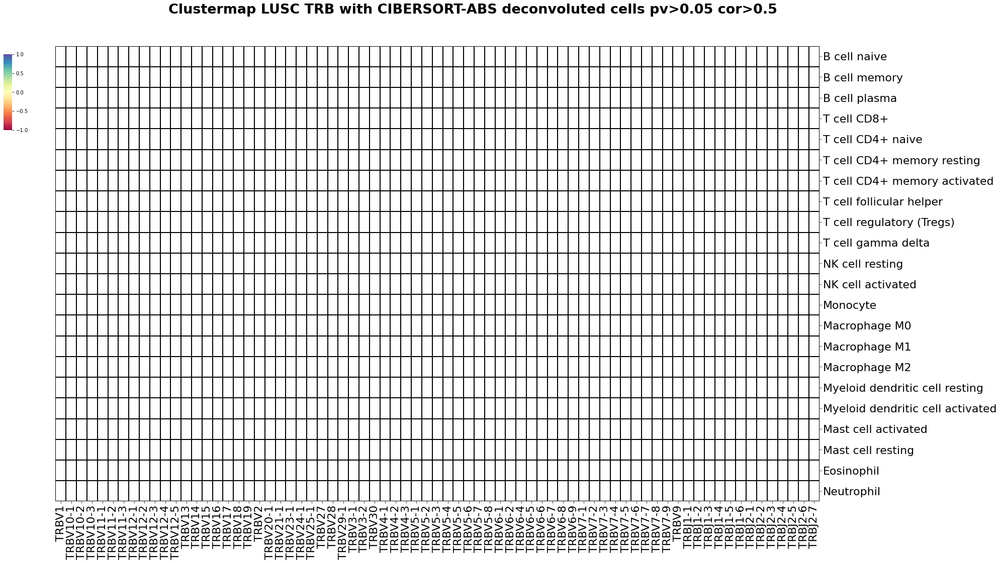

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


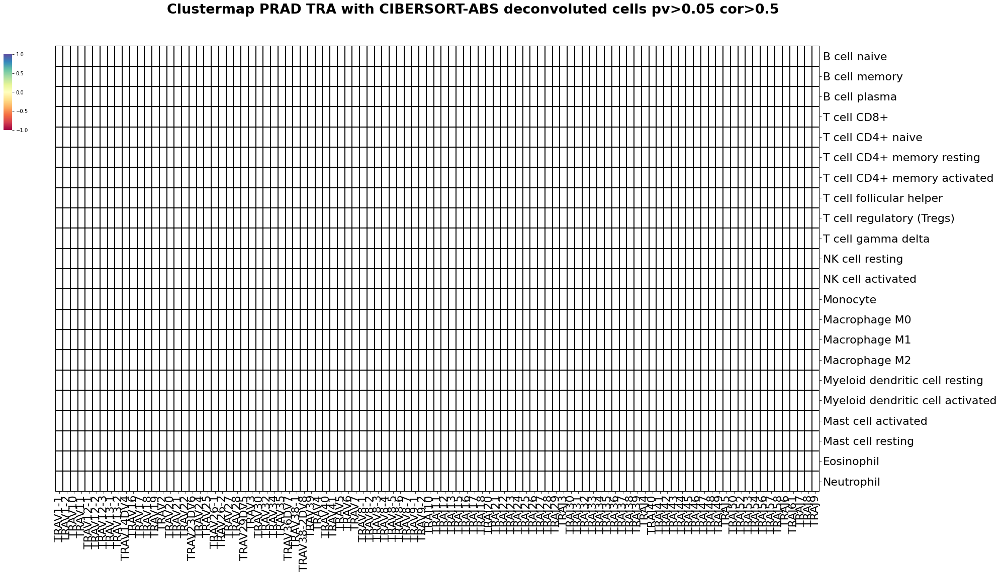

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


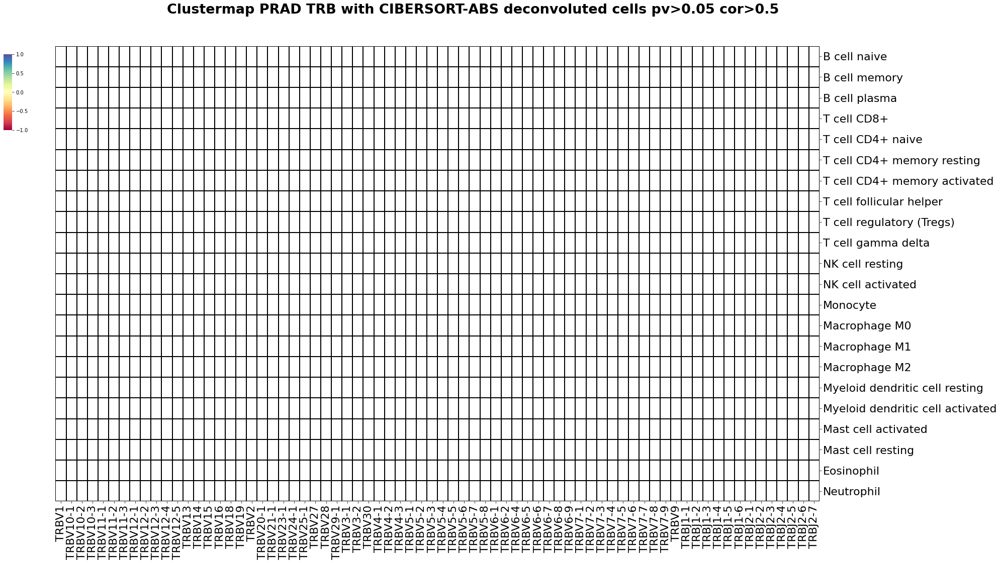

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


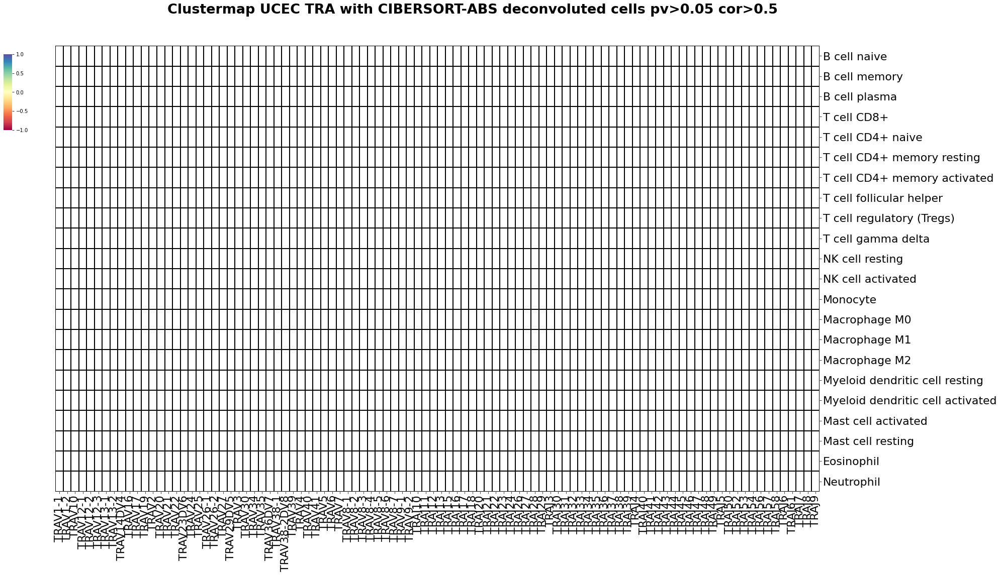

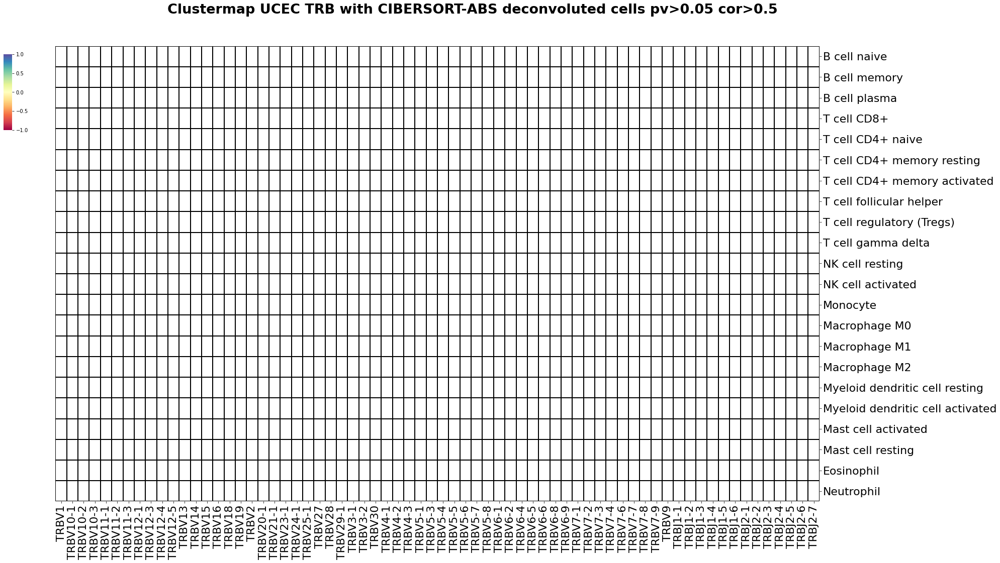

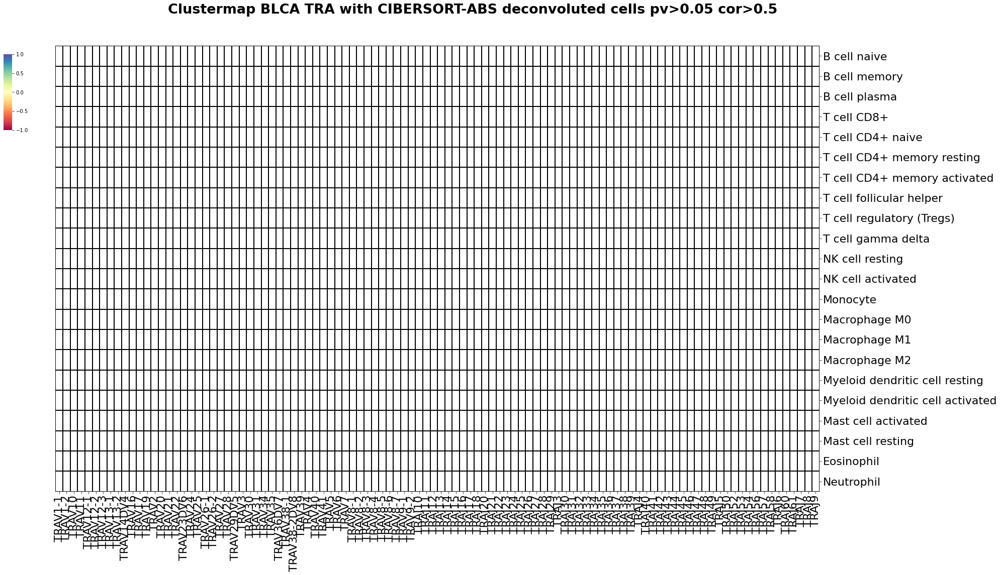

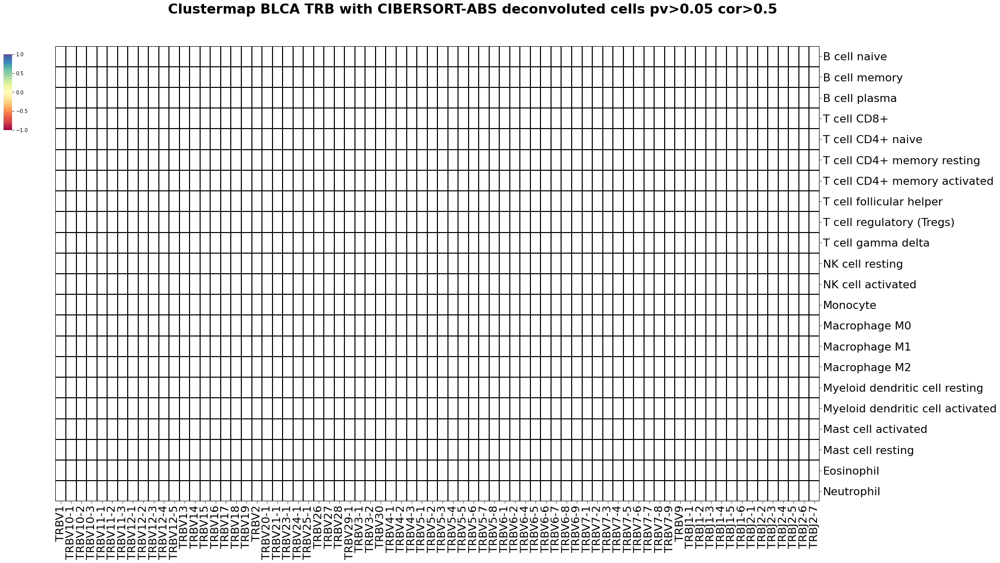

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


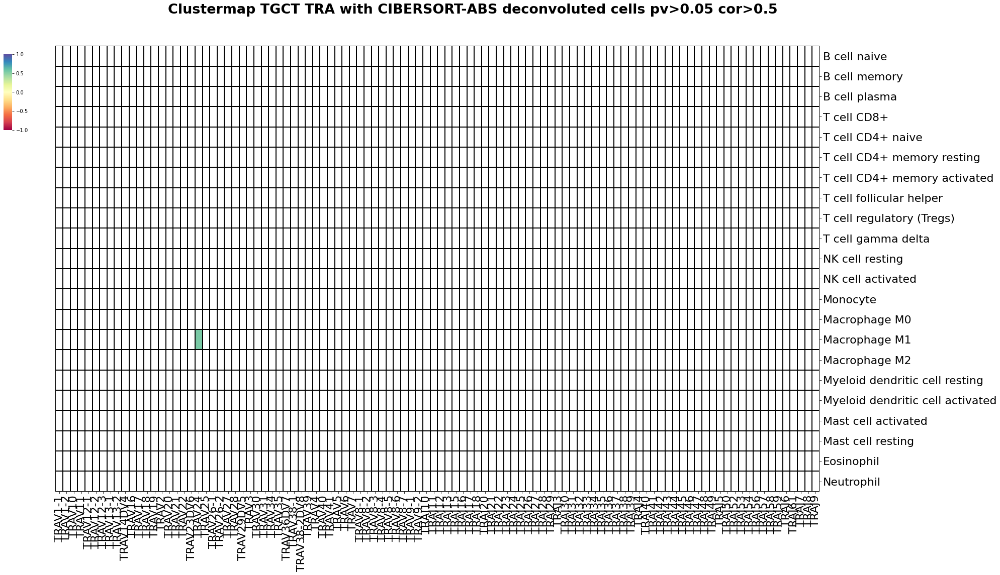

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


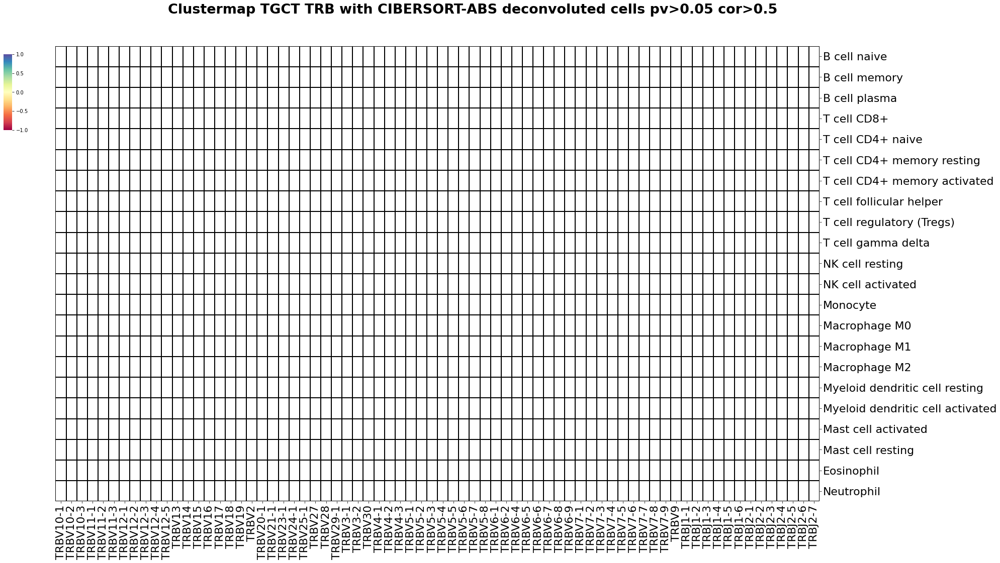

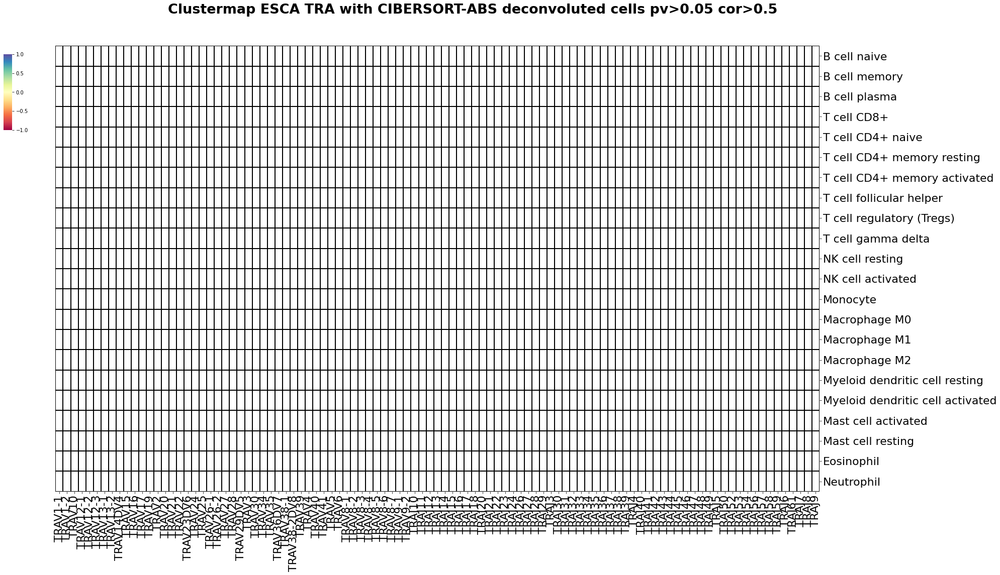

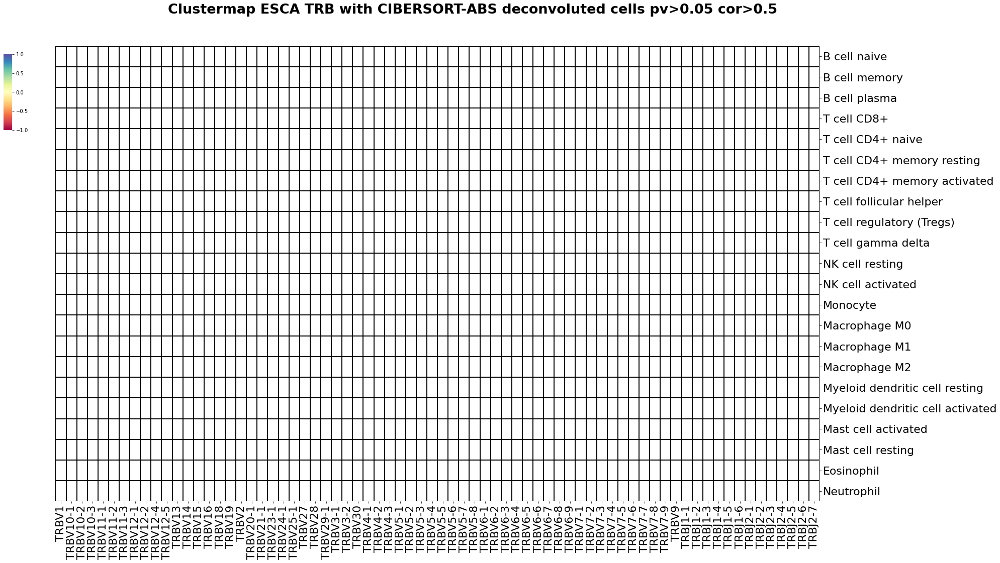

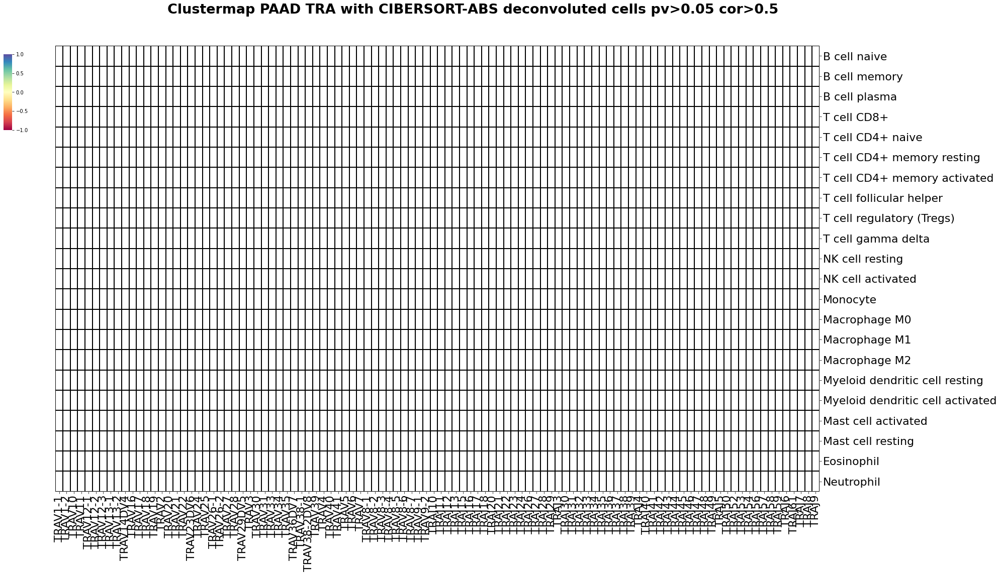

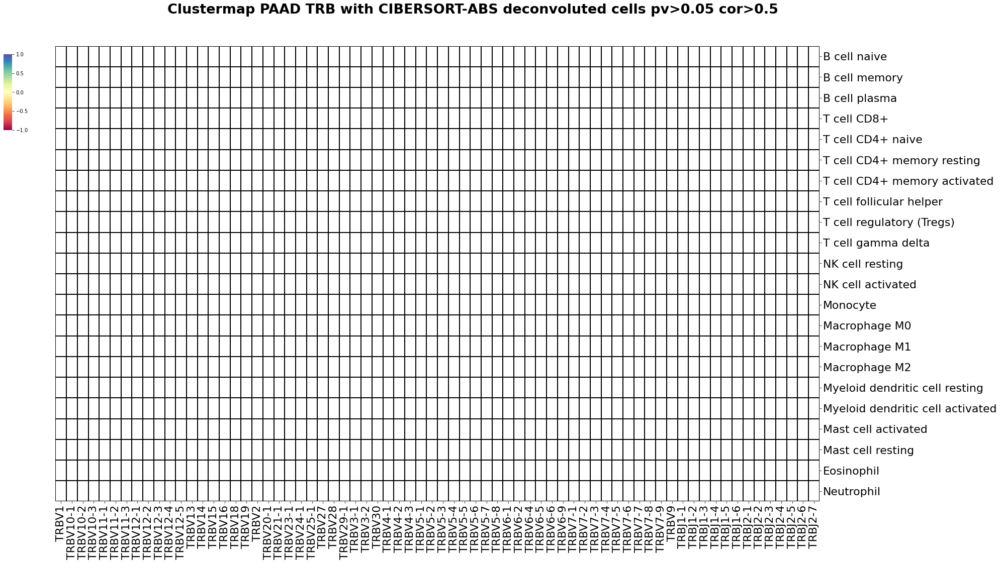

...

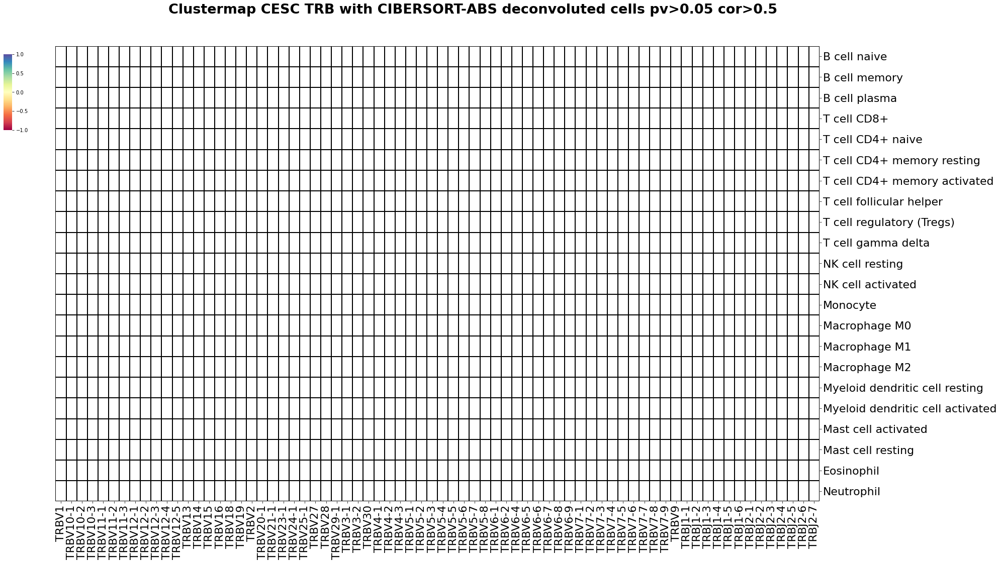

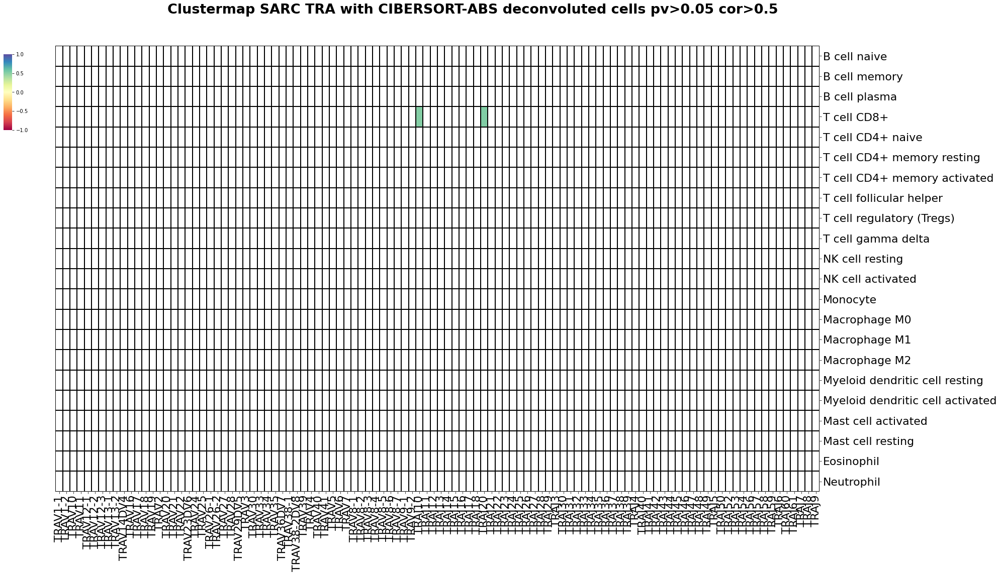

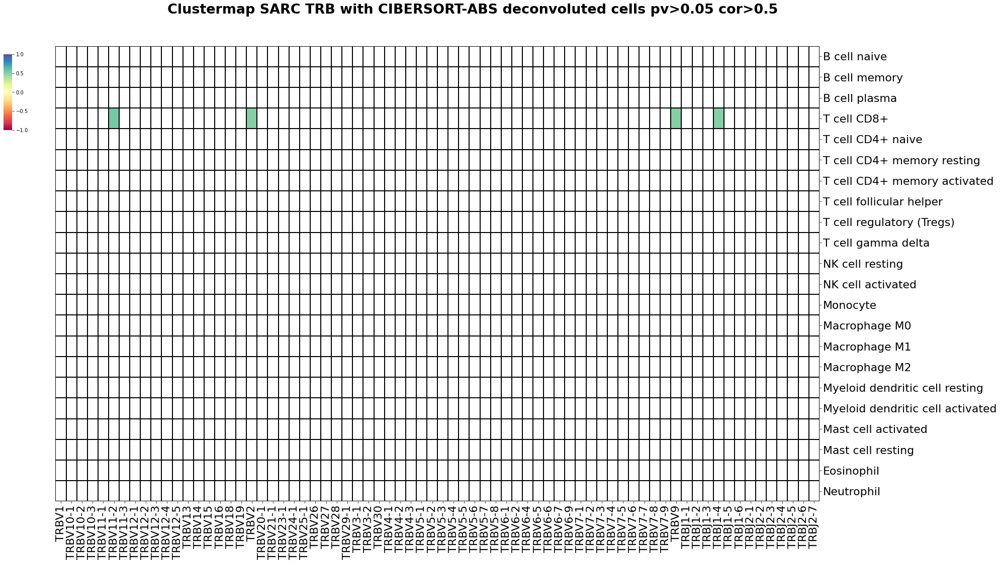

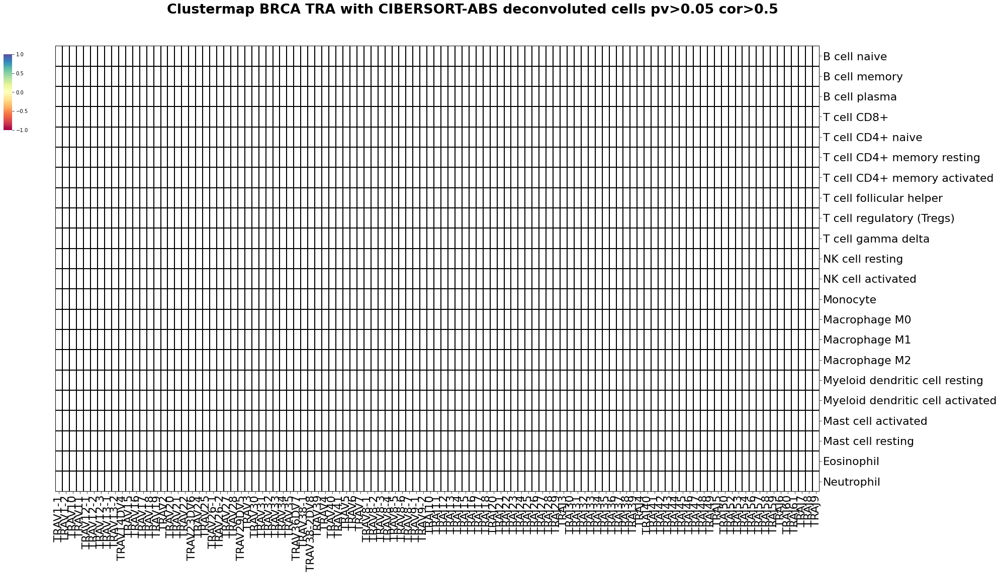

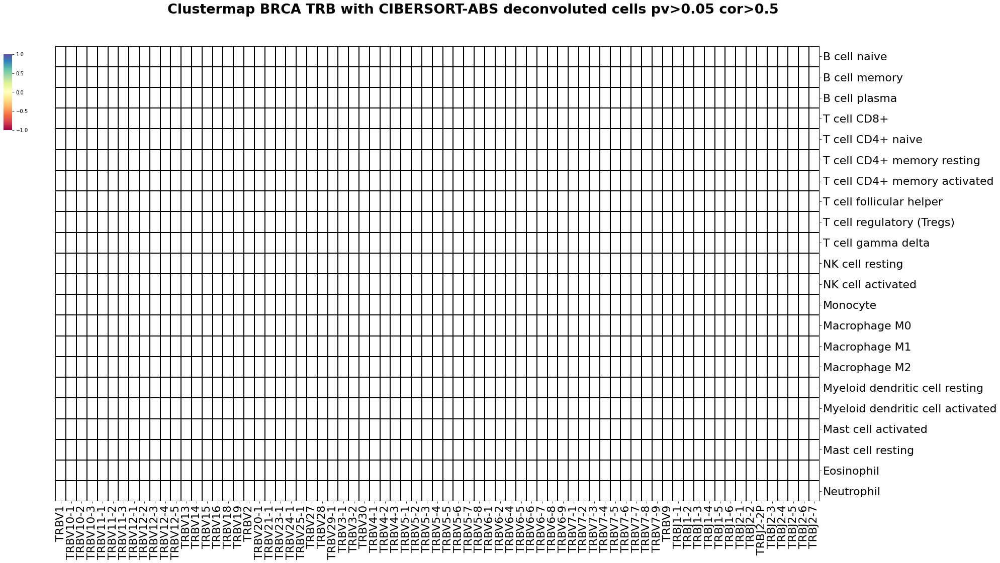

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


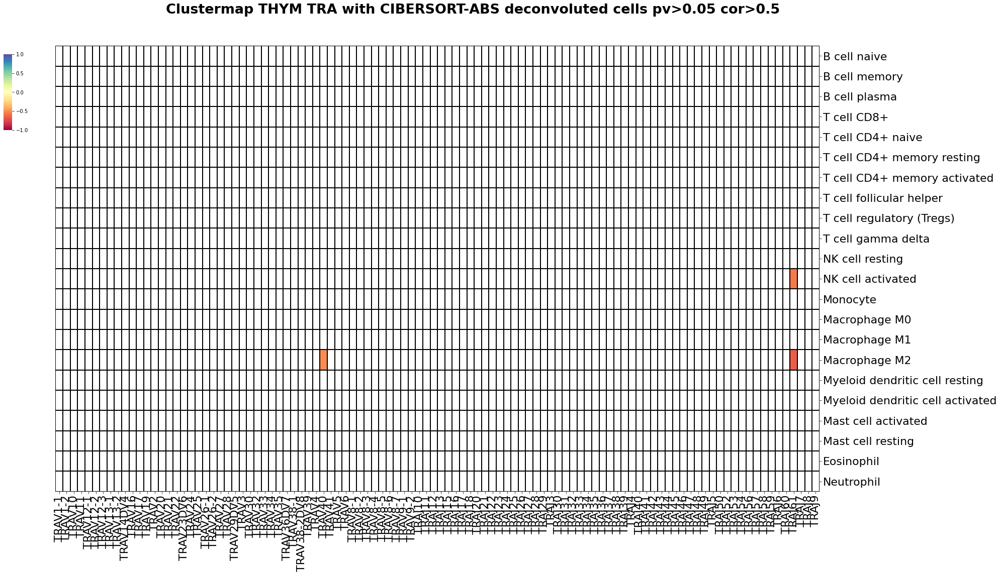

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


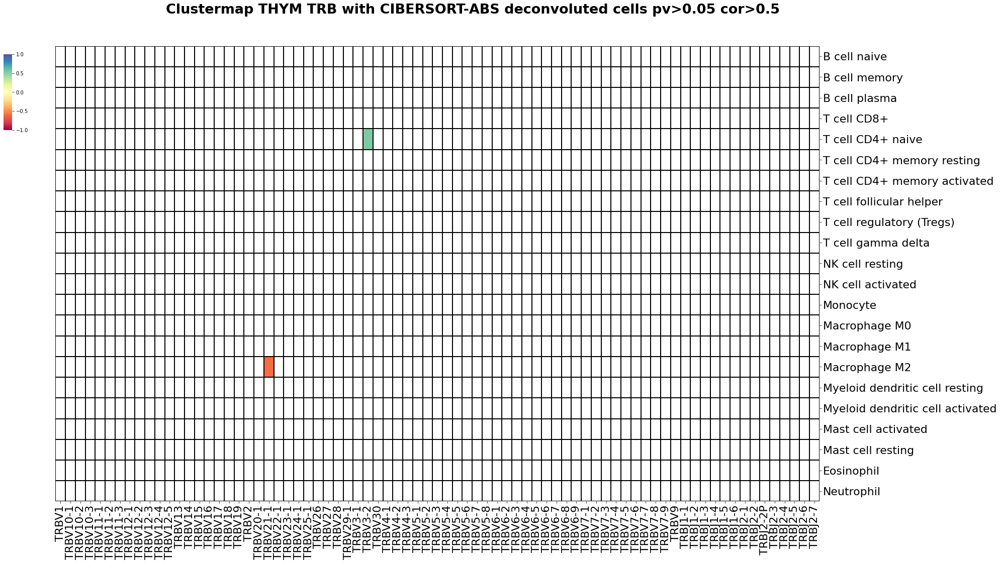

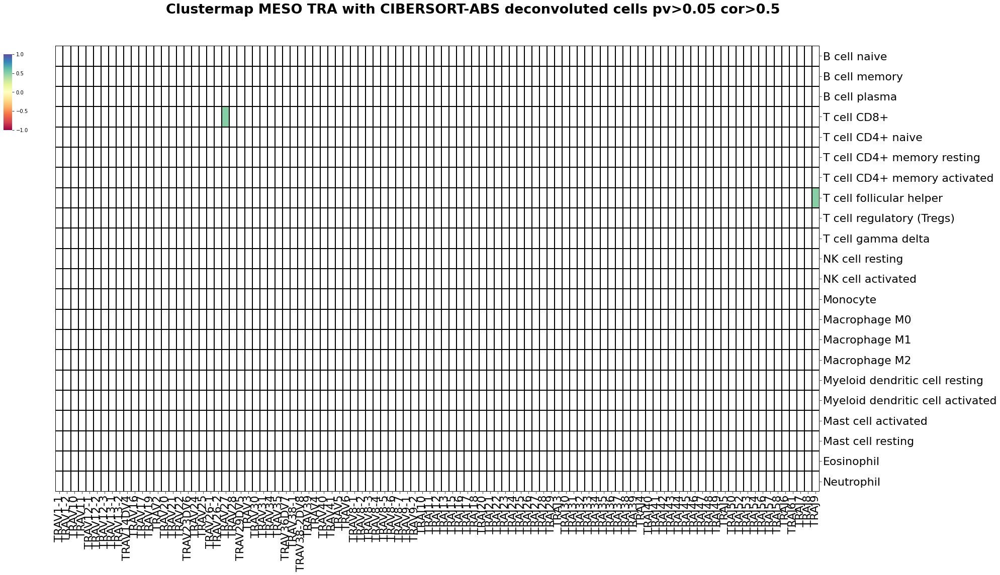

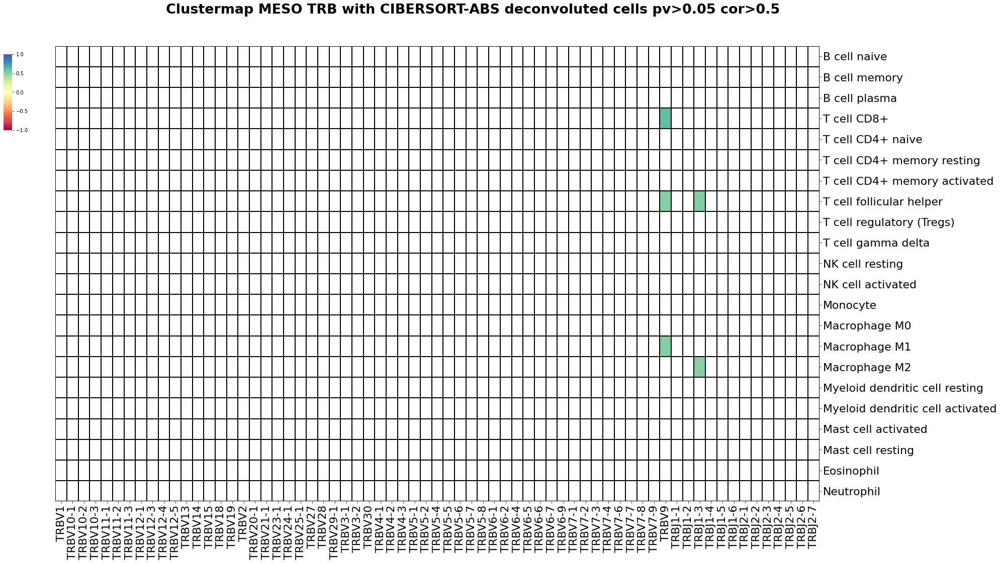

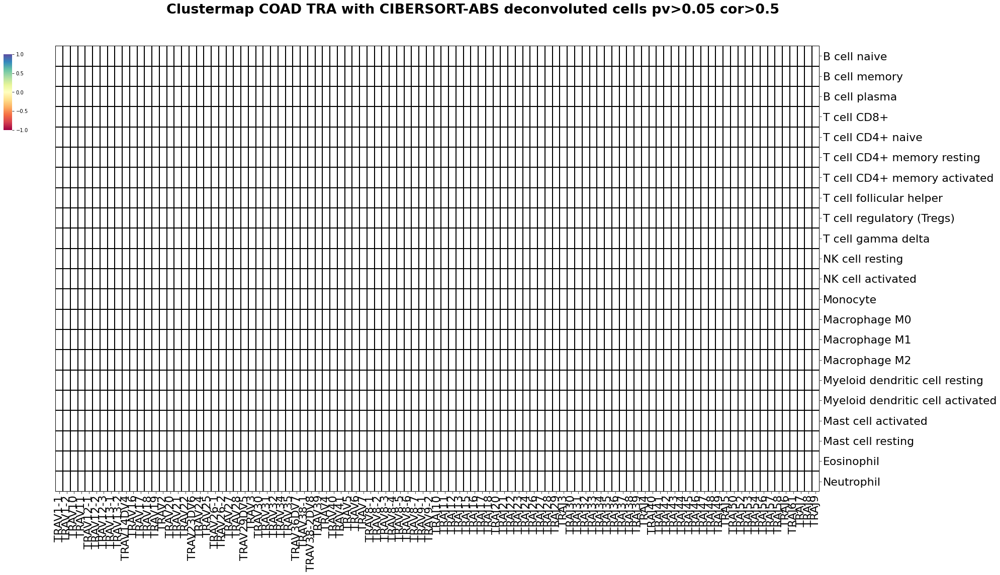

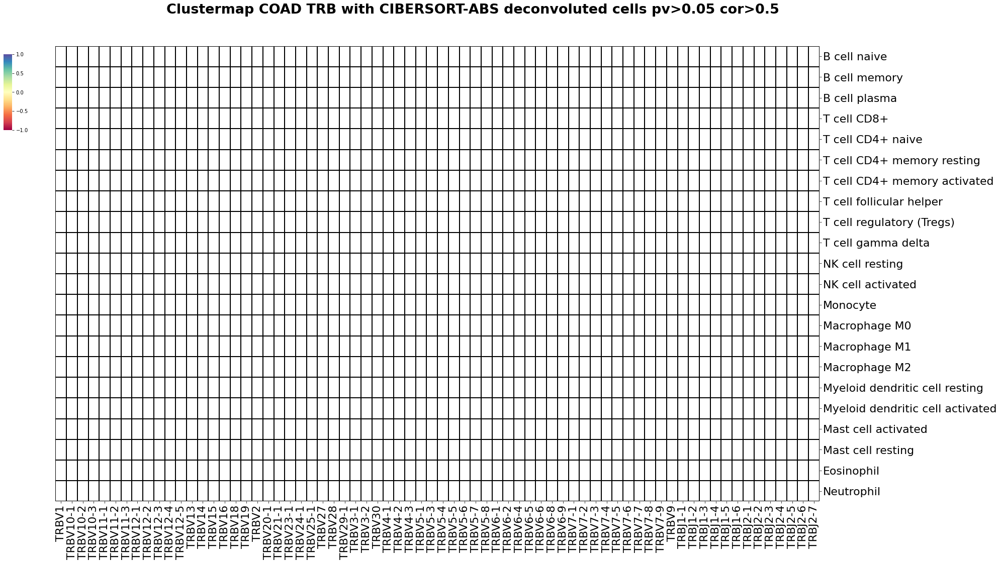

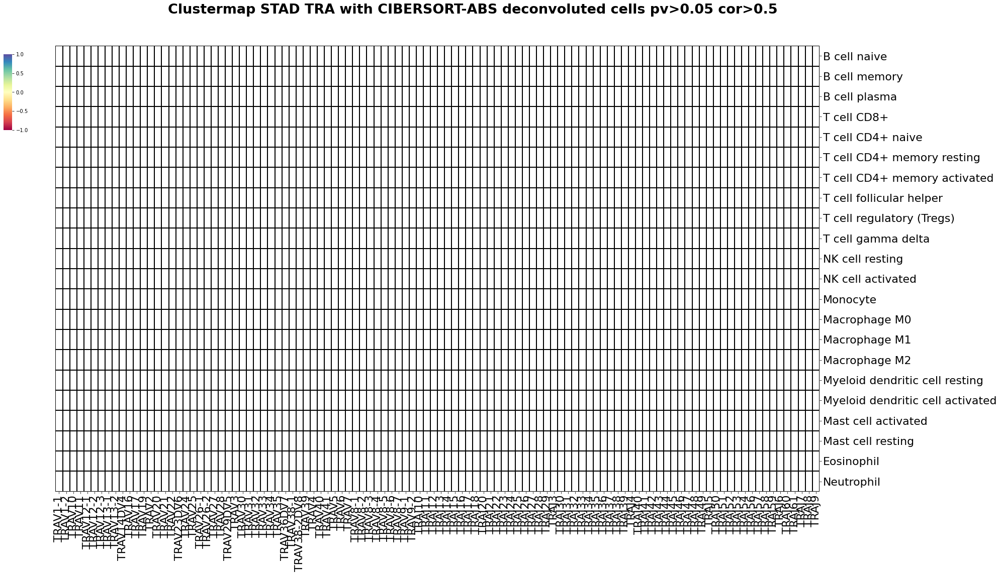

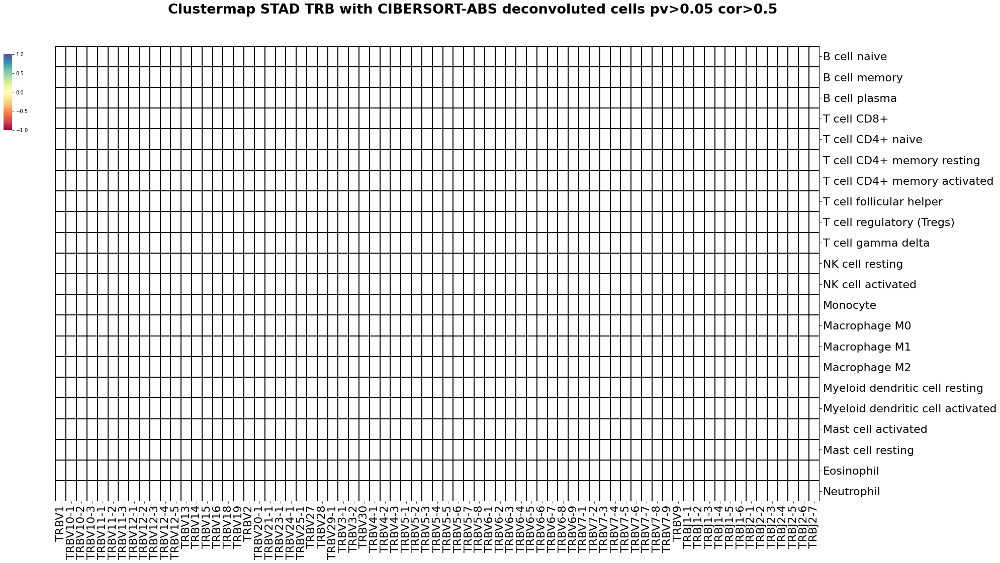

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


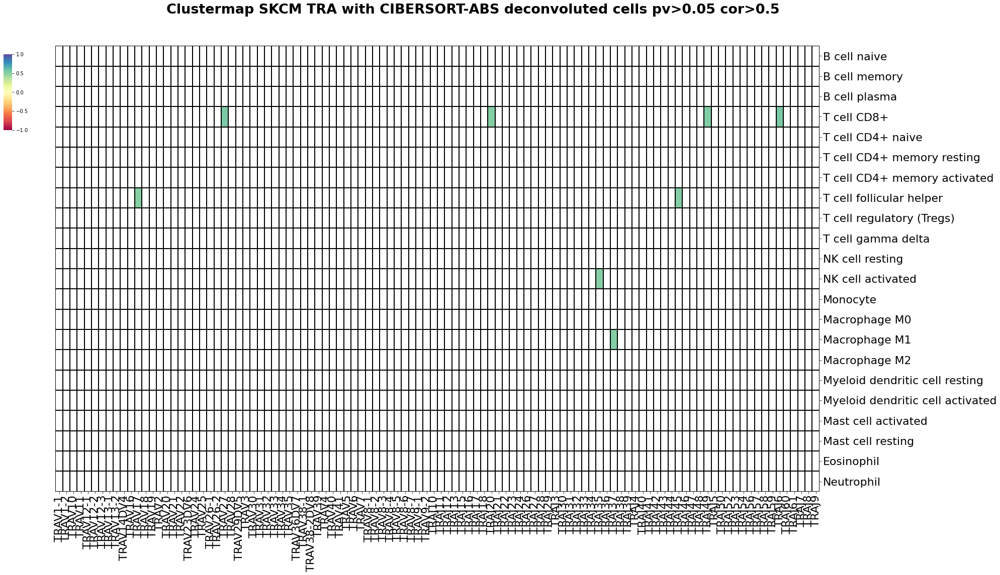

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


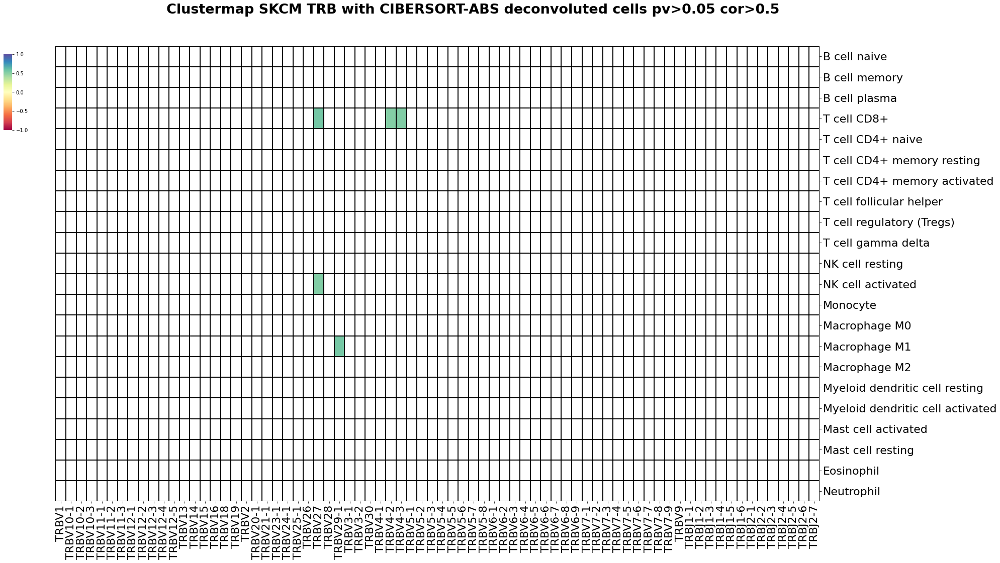

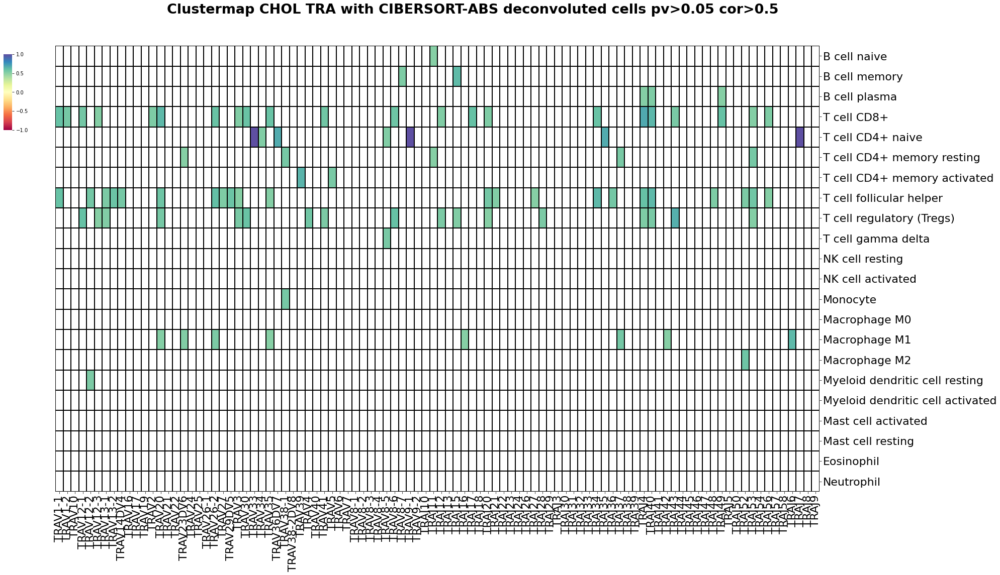

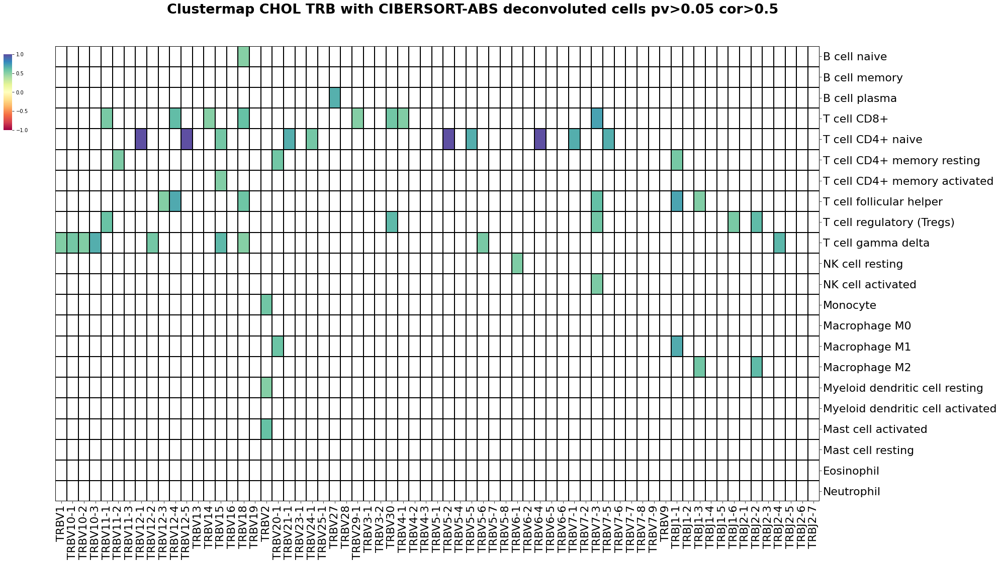

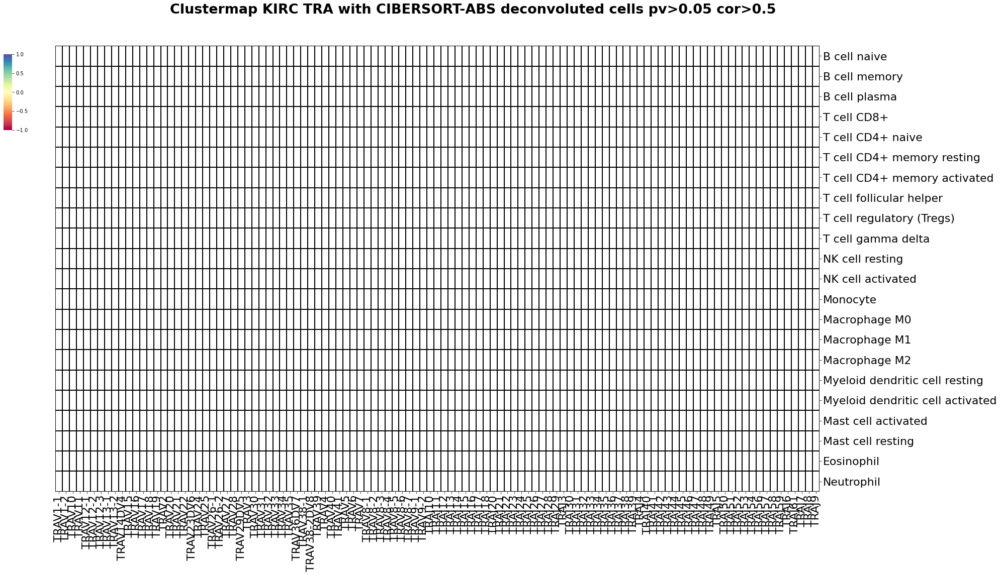

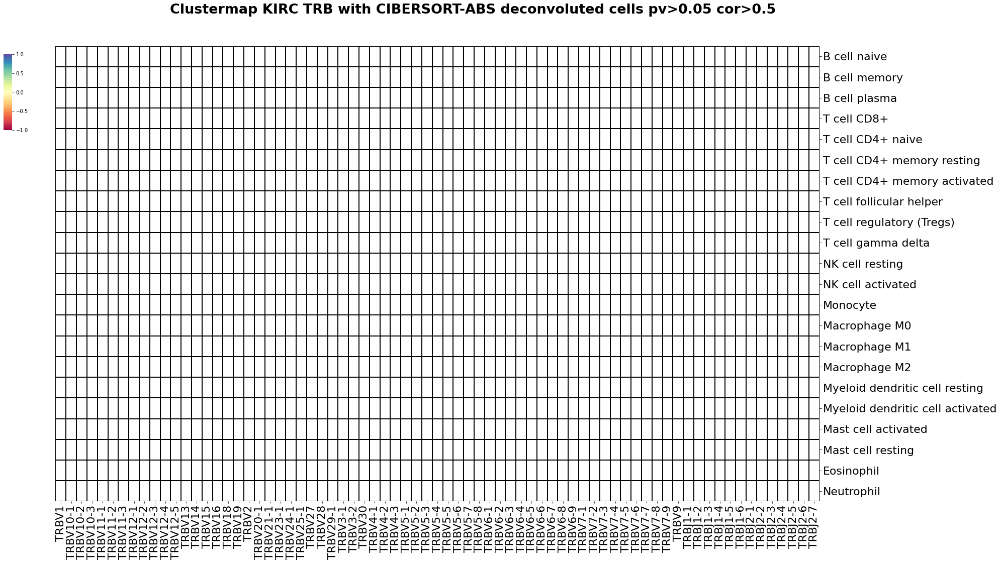

...

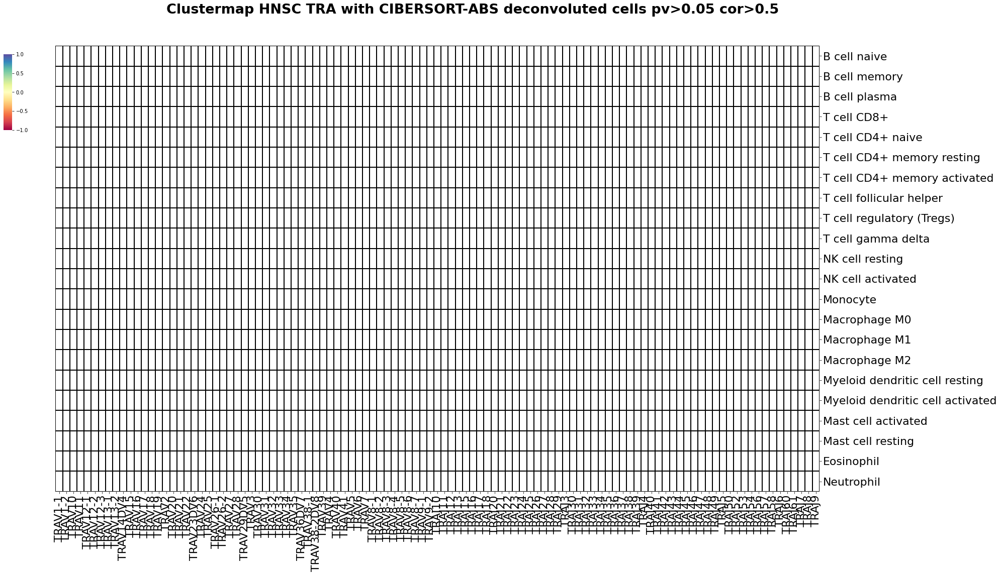

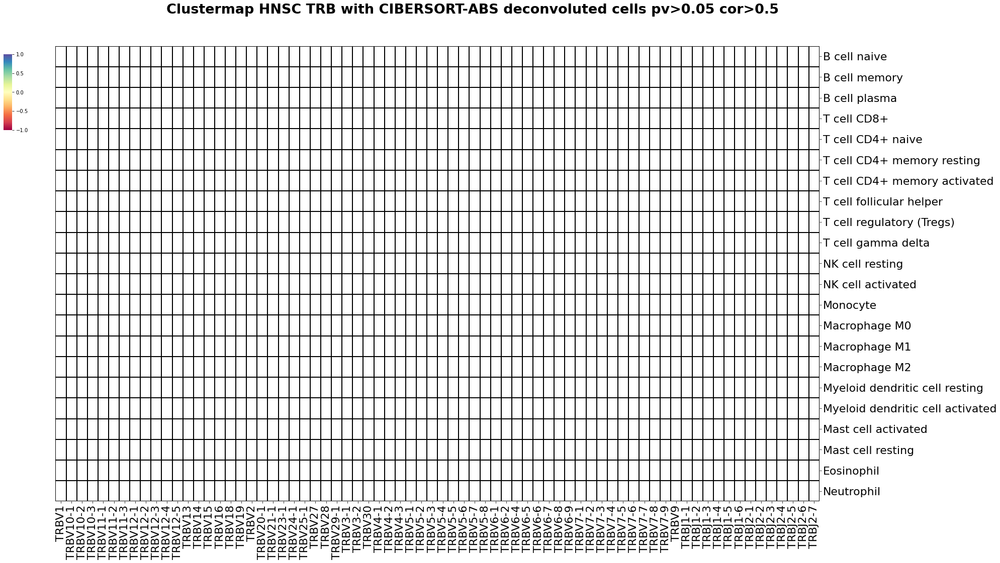

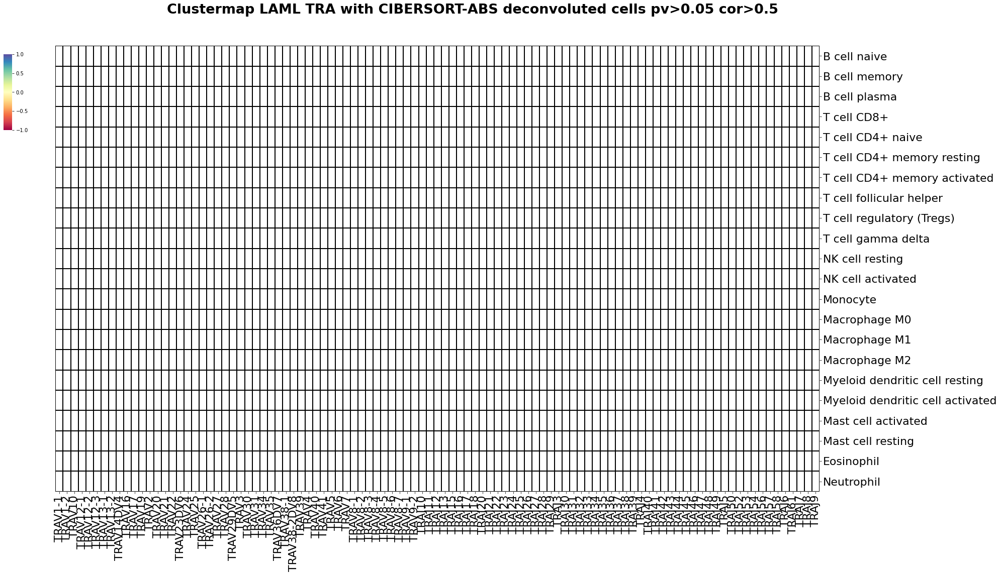

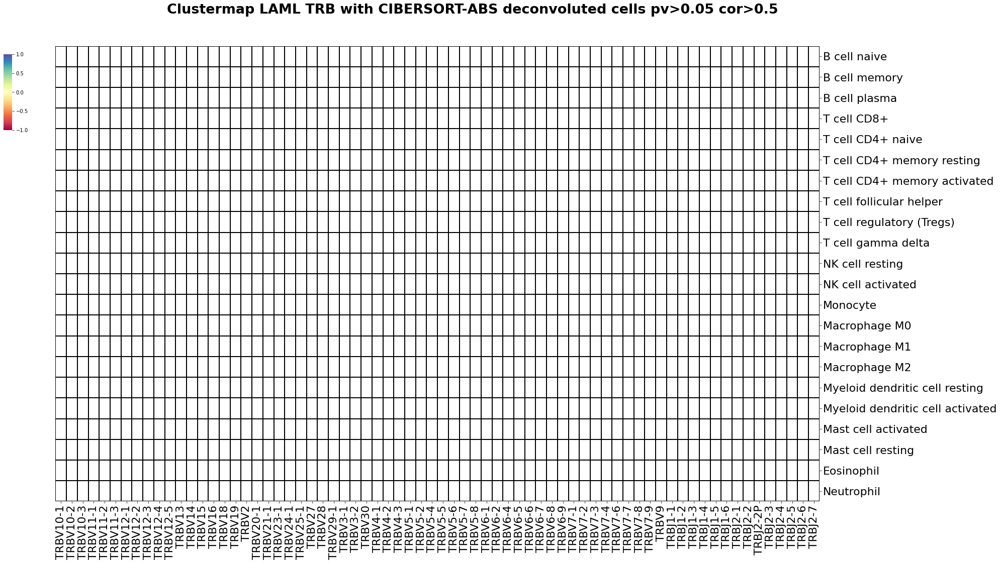

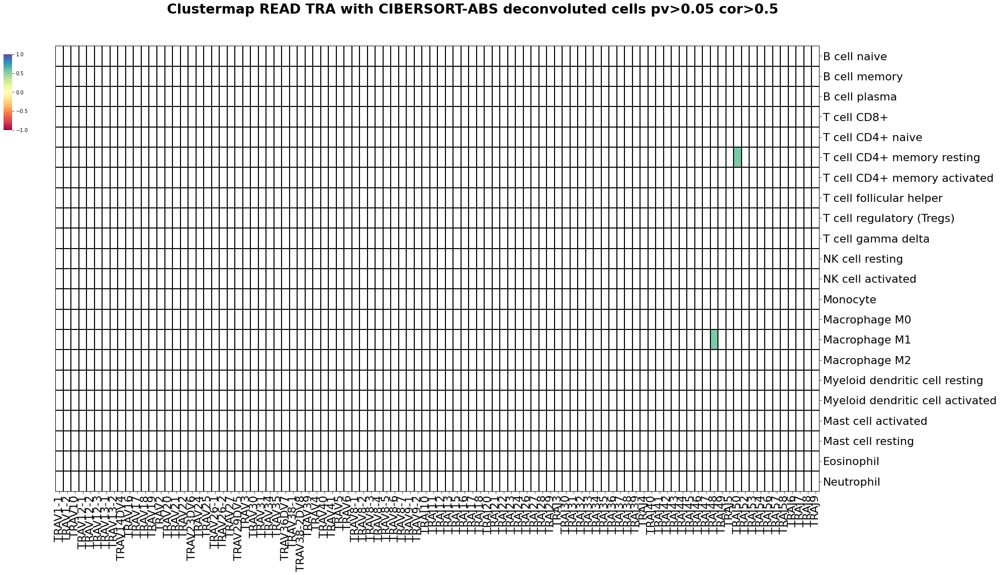

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


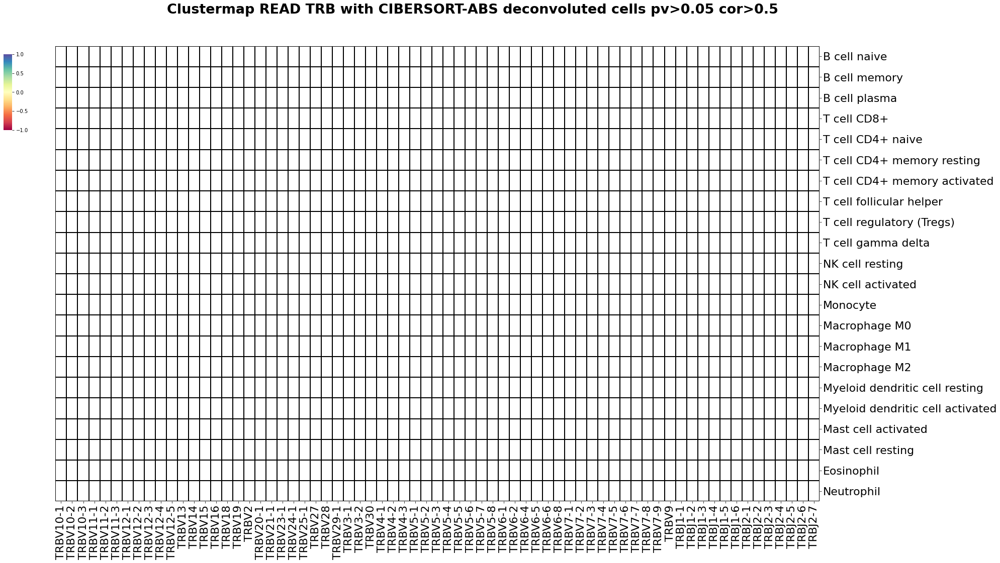

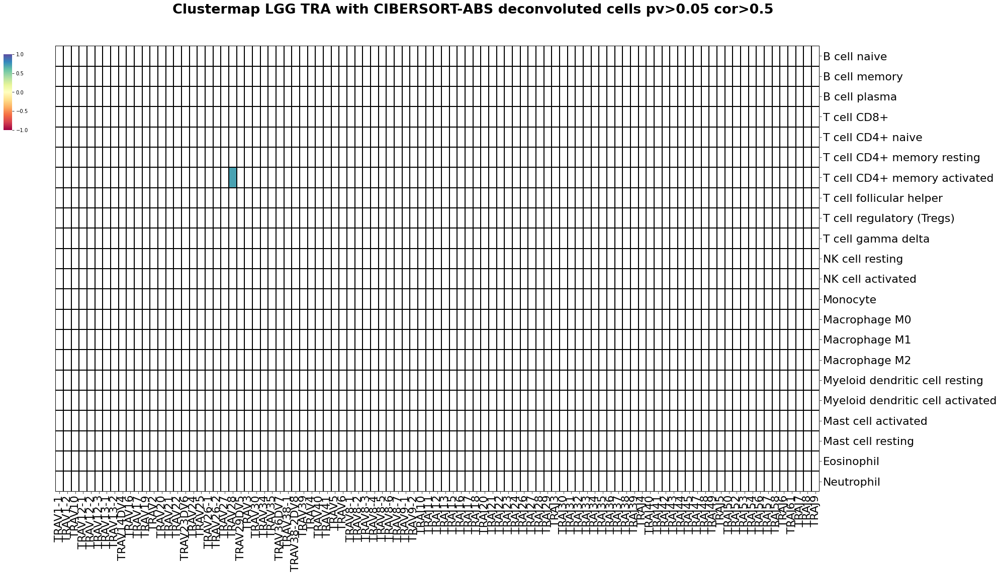

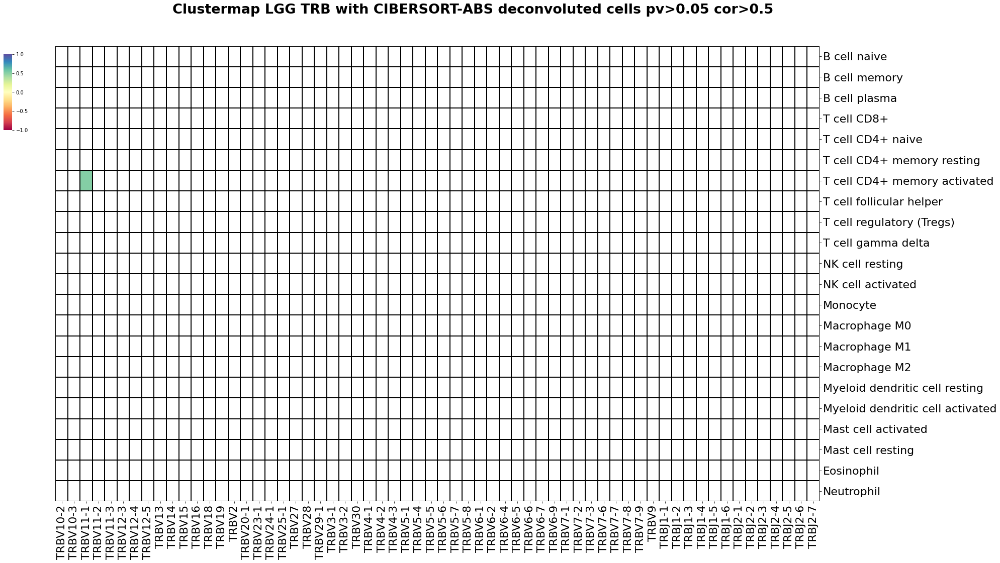

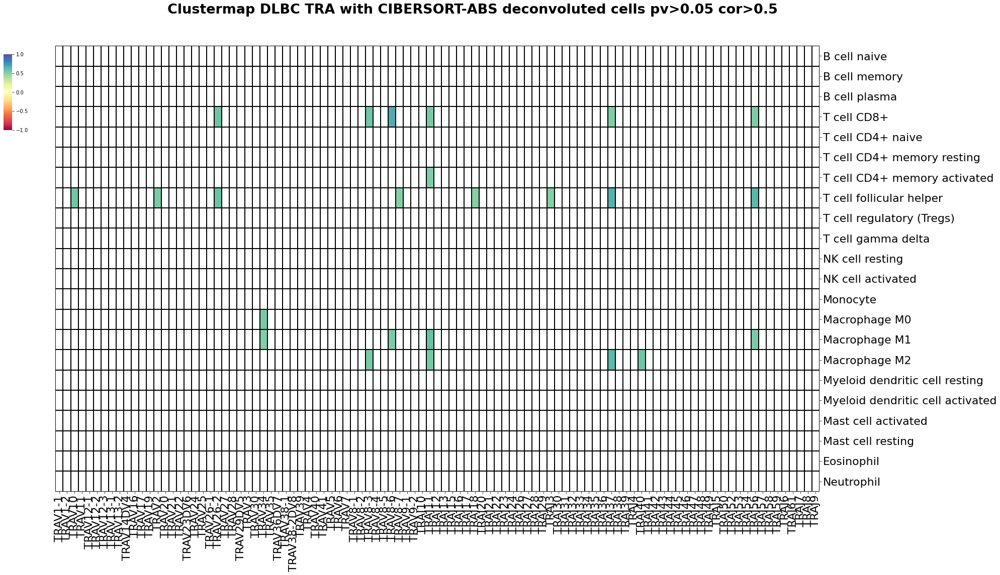

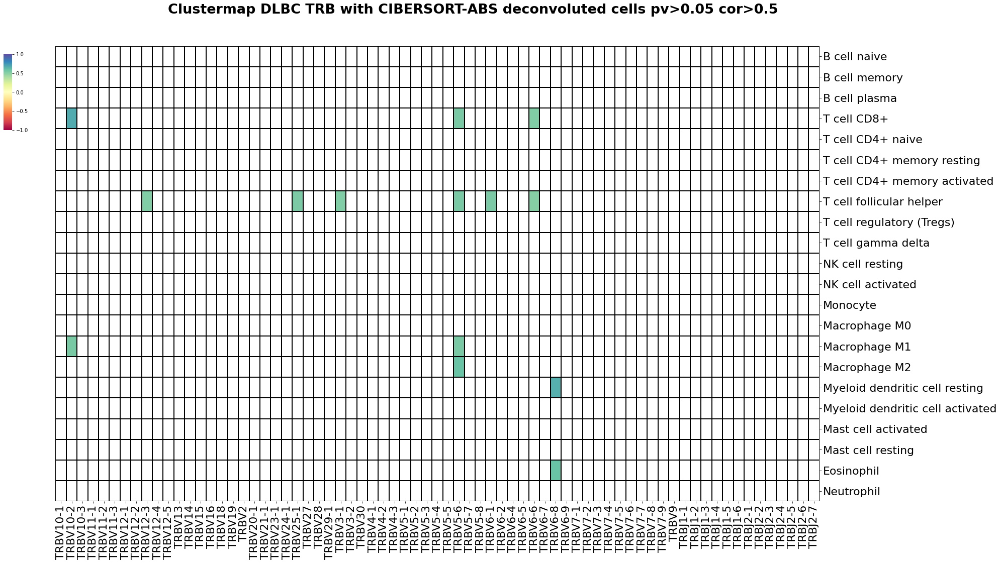

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


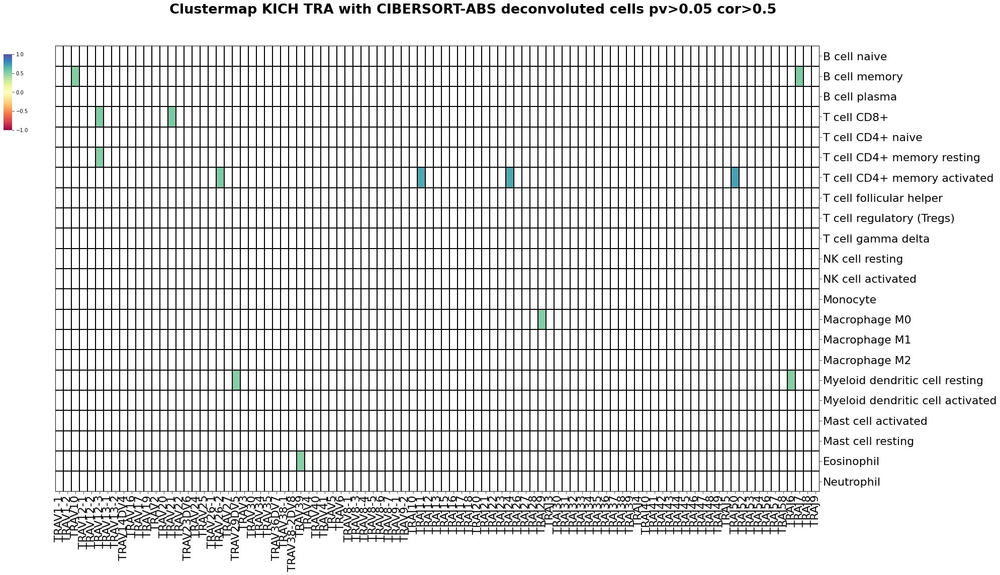

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


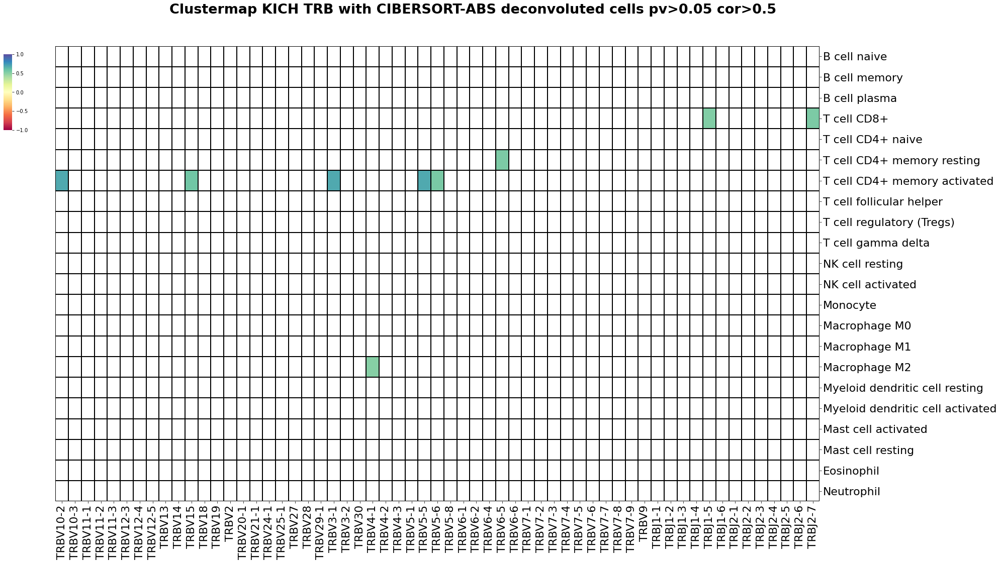

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


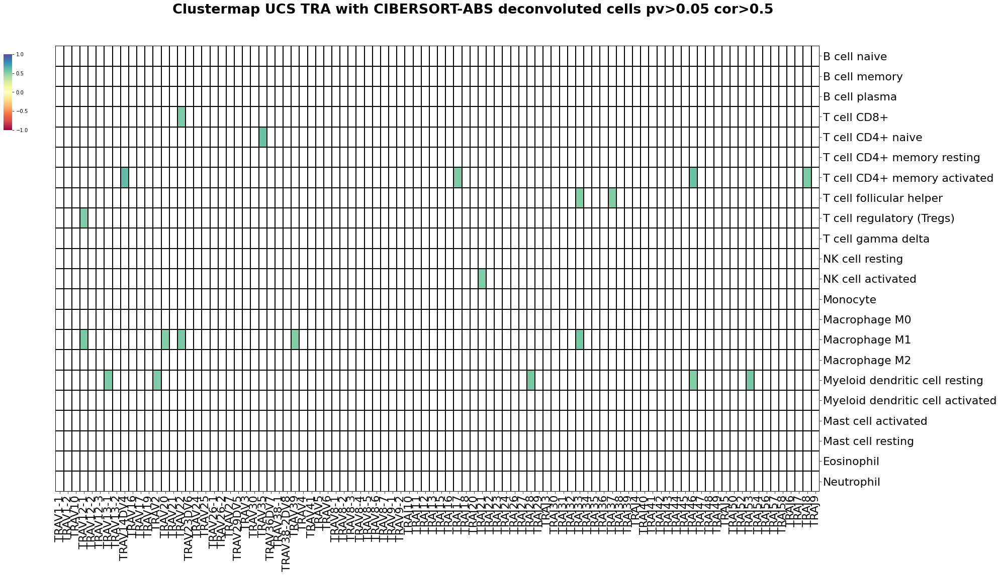

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


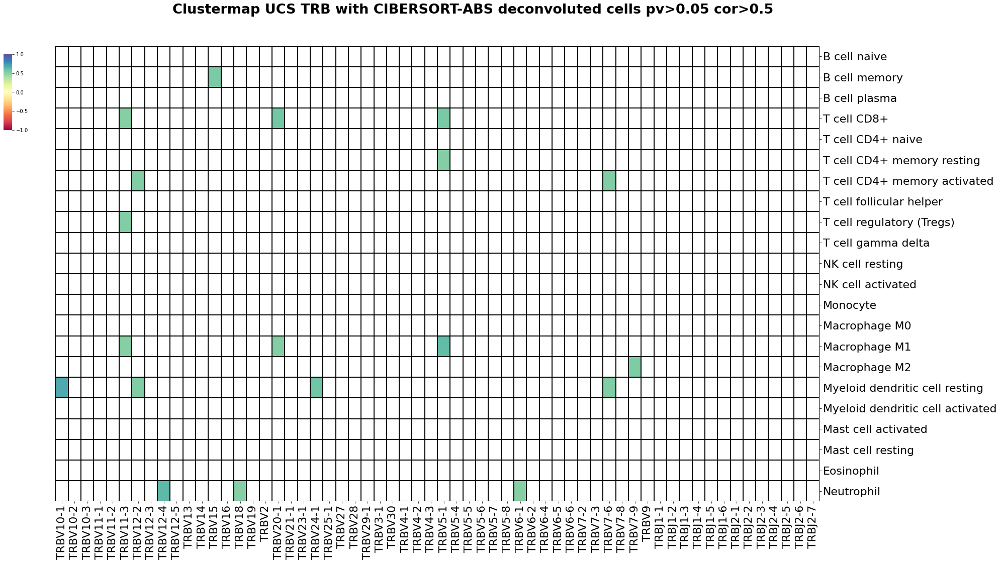

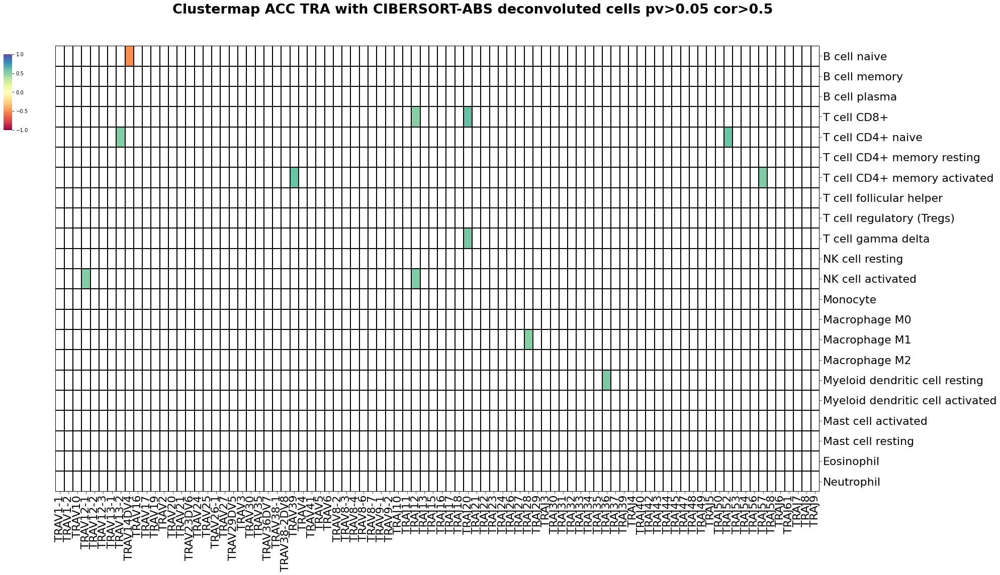

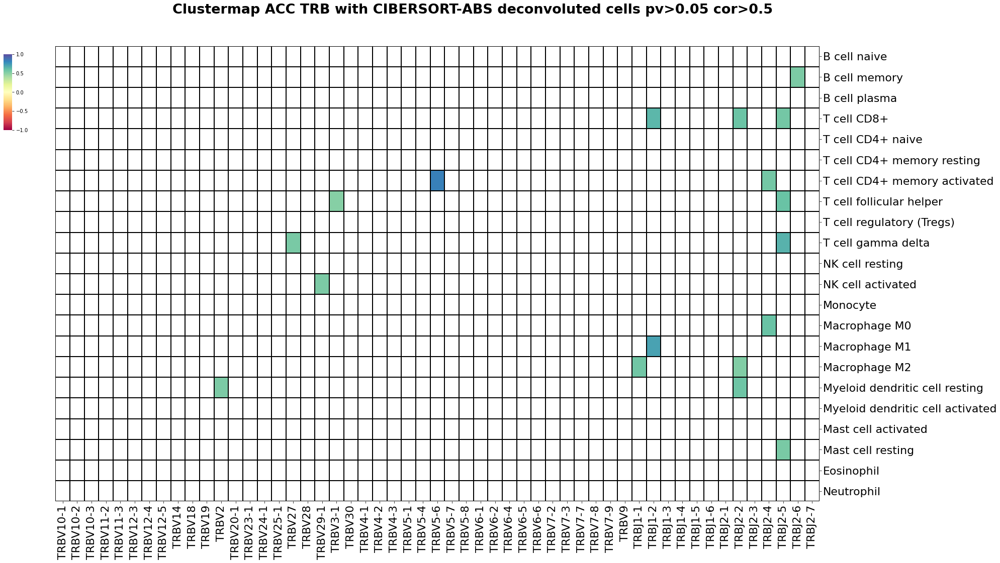

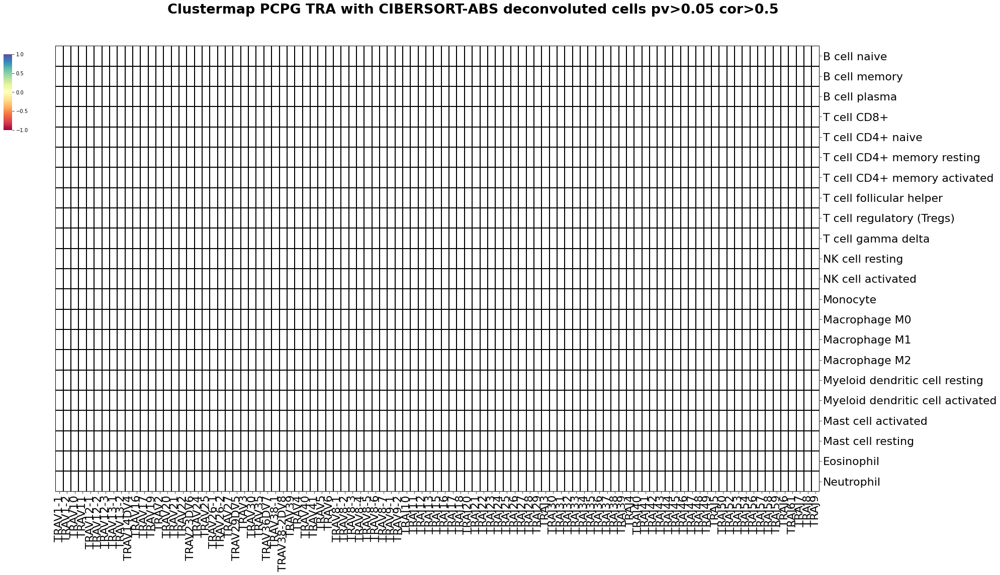

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


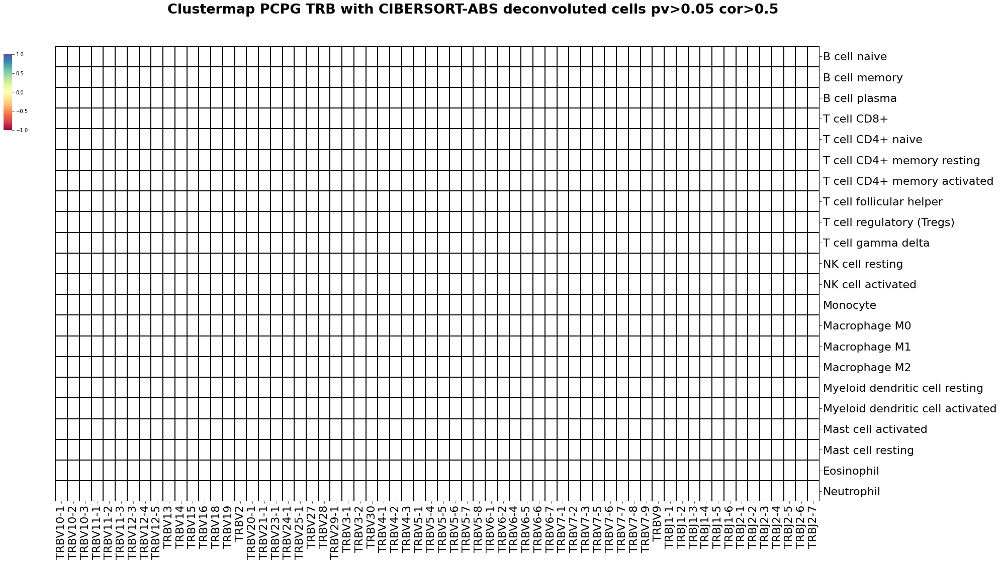

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


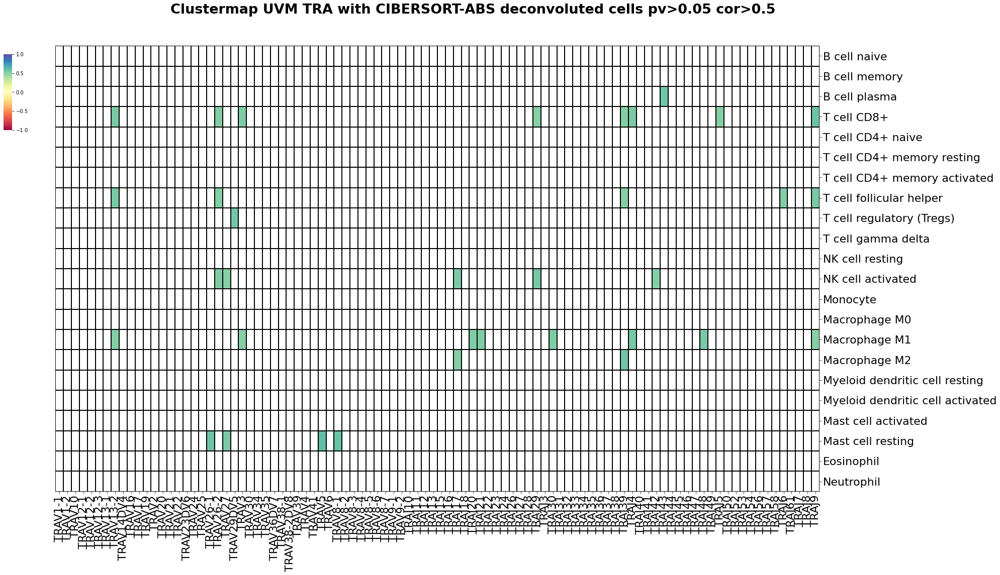

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


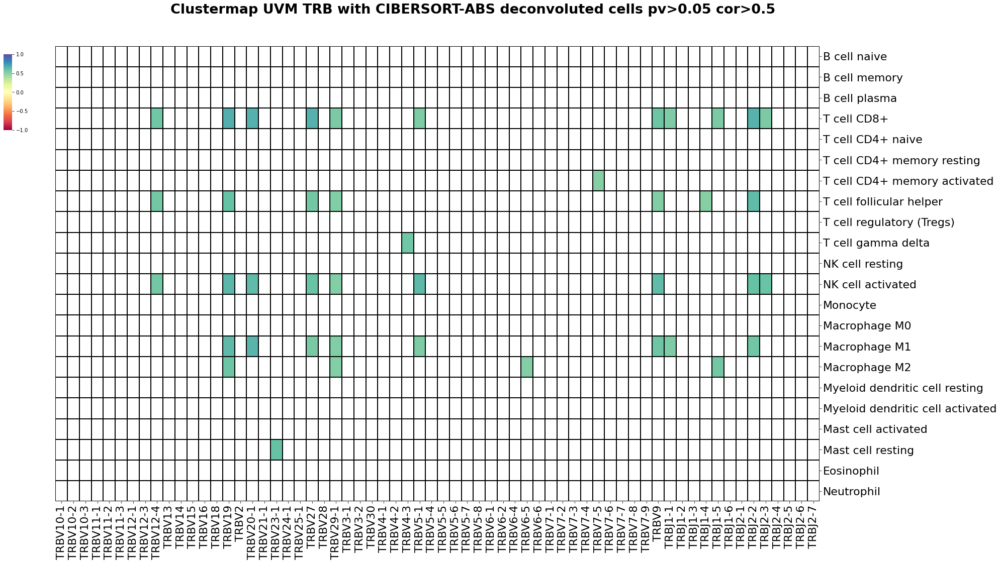

In [17]:
all_correlations = pd.DataFrame()

for cancer in cancer_types:
    tcga_type = data[data['project_id'] == cancer]
    
    tra_corr = dec_corr_TRA_TRB_heatmap(cancer=tcga_type, deconvoluted=deconv, cancer_name=cancer[5:], TR="TRA")
    trb_corr = dec_corr_TRA_TRB_heatmap(cancer=tcga_type, deconvoluted=deconv, cancer_name=cancer[5:], TR="TRB") 
    res_corr = pd.concat([tra_corr, trb_corr])
    all_correlations = pd.concat([all_correlations, res_corr], ignore_index=True)

Dataframe of all correlations

In [18]:
all_correlations

,TCGA_id,TR,Gene,Cell,Correlation
0,TGCT,TRA,TRAV24,Macrophage M1,0.543519
1,KIRP,TRB,TRBV6-7,T cell CD4+ memory activated,0.507684
2,SARC,TRA,TRAJ20,T cell CD8+,0.517073
3,SARC,TRA,TRAJ10,T cell CD8+,0.508160
4,SARC,TRB,TRBV11-2,T cell CD8+,0.551745
...,...,...,...,...,...
383,UVM,TRB,TRBV29-1,NK cell activated,0.515267
384,UVM,TRB,TRBV29-1,Macrophage M2,0.514775
385,UVM,TRB,TRBV6-5,Macrophage M2,0.512414
386,UVM,TRB,TRBJ1-4,T cell follicular helper,0.501407


In [19]:
# write table
all_correlations.to_csv("high_corrs_deconvs_genes-ABS.csv")

# Correlate all locuses

While previous analysis focused on `TRA` and `TRB` locuses correlations, we will now:
1. Compute correlations across all immune receptor types
2. Filter to retain only the highest-scoring correlations

In [18]:
def dec_corr_heatmap_all(cancer: pd.DataFrame, deconvoluted: pd.DataFrame, cancer_name: str):
    """
    Building a correlation clustermap between deconvolution and TCR (TRA or TRB) data

    Parameters:
    - cancer: DataFrame containing TCR data (TRA and TRB)  
    - deconvoluted: DataFrame with deconvolution data  
    - cancer_name: Cancer type name (for title)  
    - TR: String specifying data type ("TRA" or "TRB"). Default: "TRA"
    """
    sample_sums = cancer.groupby('sample')['duplicate_count'].sum()
    counts_v = (
        cancer.groupby(['sample', 'v_call'])['duplicate_count']
        .sum()
        .div(sample_sums)  
        .reset_index()
        .pivot(index='sample', columns='v_call', values='duplicate_count')
        .fillna(0)
    )
    counts_j = (
        cancer.groupby(['sample', 'j_call'])['duplicate_count']
        .sum()
        .div(sample_sums) 
        .reset_index()
        .pivot(index='sample', columns='j_call', values='duplicate_count')
        .fillna(0)
    )

    tr_vj = pd.merge(counts_v, counts_j, on='sample', how='inner')

    dec_numeric = deconvoluted.set_index("cell_type").select_dtypes(include=['number'])
    tr_numeric = tr_vj.select_dtypes(include=['number'])
    # get common samples    
    common_samples = dec_numeric.index.intersection(tr_numeric.index)
    dec_numeric = dec_numeric.loc[common_samples]
    tr_numeric = tr_numeric.loc[common_samples]
    dec_numeric = dec_numeric.loc[~dec_numeric.index.duplicated(keep='first')]

    merged_df = pd.concat([dec_numeric, tr_numeric], axis=1, join="inner")

    # get corrs and p-values
    corr_matrix, p_value_matrix = spearmanr(merged_df)
    corr_df = pd.DataFrame(corr_matrix, index=merged_df.columns, columns=merged_df.columns)
    p_value_df = pd.DataFrame(p_value_matrix, index=merged_df.columns, columns=merged_df.columns)

    # filter corrs and p-values
    filtered_corr = corr_df.loc[dec_numeric.columns, tr_numeric.columns]
    filtered_pv = p_value_df.loc[dec_numeric.columns, tr_numeric.columns]

    # mask for p-values
    pval_mask = filtered_pv >= 0.05
    corr_mask = np.abs(filtered_corr) < 0.5
    final_mask = pval_mask | corr_mask
    
    pallete = sns.color_palette("Spectral", as_cmap=True)
    filtered_corr_masked = filtered_corr.copy()
    filtered_corr_masked[final_mask] = np.nan

    high_corr_df = (filtered_corr_masked.stack().reset_index()    
    .rename(columns={
        'level_0': 'Cell',    
        'level_1': 'Gene',    
        0: 'Correlation'})
    .dropna()         
    .assign(          
        TCGA_id=cancer_name,      
    )
    [['TCGA_id', 'Gene', 'Cell', 'Correlation']]  
    .sort_values('Correlation', key=abs, ascending=False) 
    .reset_index(drop=True))
    
    g = sns.clustermap(
        filtered_corr_masked,
        cmap=pallete,
        vmin=-1, vmax=1,  
        annot=False,
        fmt=".1f",      
        linewidths=0.3,   
        linecolor='black', 
        mask=final_mask,
        figsize=(24, 14),   # Размер холста
        cbar_pos=(-0.04, 0.8, 0.01, 0.15),  
        dendrogram_ratio=(.015, .025),  
        square=False,
        row_cluster=False,  
    col_cluster=False   
    )
    g.ax_heatmap.set_facecolor("white")
    g.fig.suptitle(f"Clustermap {cancer_name} with CIBERSORT-ABS deconvoluted cells pv>0.05 cor>0.5", y=1.05, fontsize=27, fontweight="bold")
    plt.setp(g.ax_heatmap.get_xticklabels(), fontsize=22)  # Подписи по оси X
    plt.setp(g.ax_heatmap.get_yticklabels(), fontsize=22)  # Подписи по оси Y
    save_path = f'./pics/ALL_{cancer_name}-ABS_norm-deconv-cor.png'
    g.savefig(save_path, dpi=50, bbox_inches='tight')  # 
    plt.show()
    
    return high_corr_df

Тестим

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


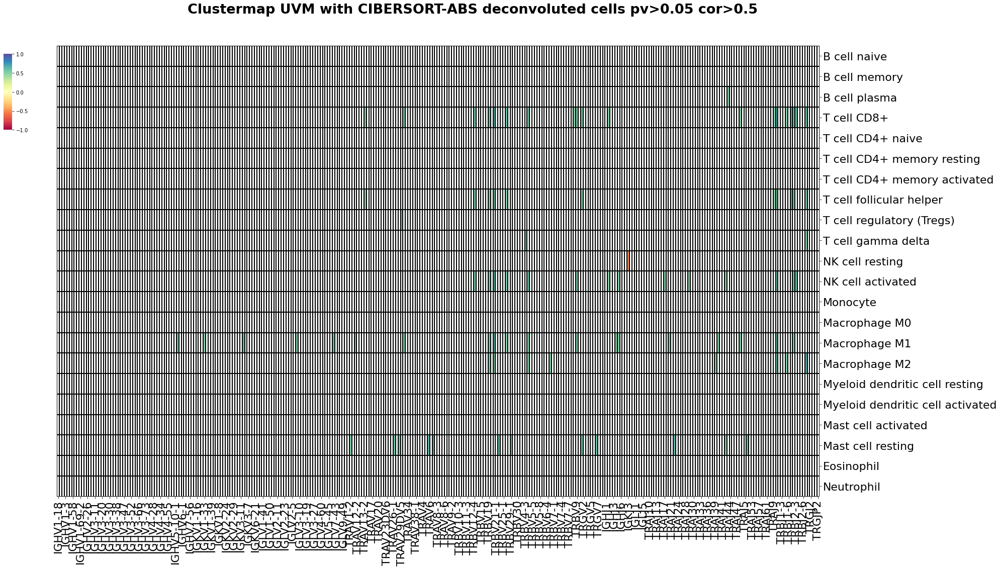

,TCGA_id,Gene,Cell,Correlation
0,UVM,TRBJ2-7,Macrophage M2,0.679238
1,UVM,TRBJ1-1,T cell CD8+,0.660192
2,UVM,TRBJ2-2,T cell CD8+,0.647951
3,UVM,TRAJ22,Mast cell resting,0.642607
4,UVM,TRAV5,Mast cell resting,0.637245
...,...,...,...,...
83,UVM,TRAJ48,T cell CD8+,0.502243
84,UVM,TRAV13-2,T cell follicular helper,0.502002
85,UVM,TRAJ4,Macrophage M1,0.501159
86,UVM,TRAV12-1,Macrophage M1,0.500568


In [17]:
a = dec_corr_heatmap_all(uvm, deconv, cancer_name="UVM")
a

Count all

In [19]:
cancer_types = data.project_id.unique().tolist()
print(cancer_types)

['TCGA-GBM', 'TCGA-OV', 'TCGA-LUAD', 'TCGA-LUSC', 'TCGA-PRAD', 'TCGA-UCEC', 'TCGA-BLCA', 'TCGA-TGCT', 'TCGA-ESCA', 'TCGA-PAAD', 'TCGA-KIRP', 'TCGA-LIHC', 'TCGA-CESC', 'TCGA-SARC', 'TCGA-BRCA', 'TCGA-THYM', 'TCGA-MESO', 'TCGA-COAD', 'TCGA-STAD', 'TCGA-SKCM', 'TCGA-CHOL', 'TCGA-KIRC', 'TCGA-THCA', 'TCGA-HNSC', 'TCGA-LAML', 'TCGA-READ', 'TCGA-LGG', 'TCGA-DLBC', 'TCGA-KICH', 'TCGA-UCS', 'TCGA-ACC', 'TCGA-PCPG', 'TCGA-UVM']


/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


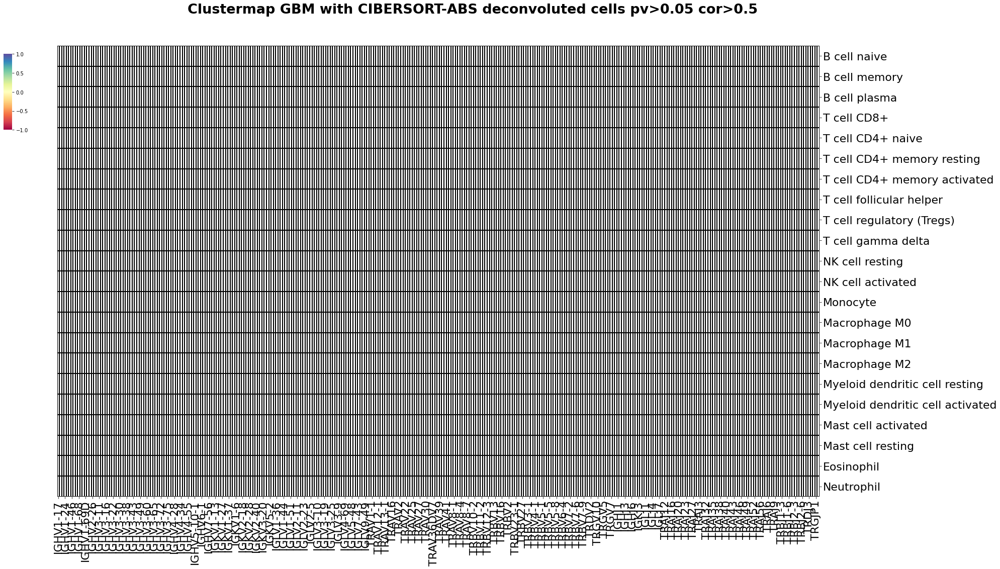

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


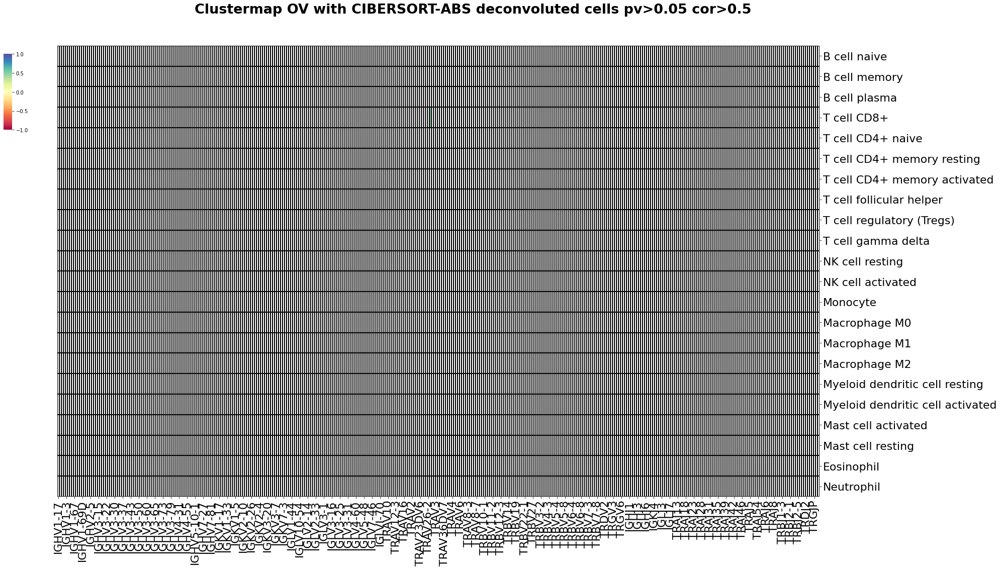

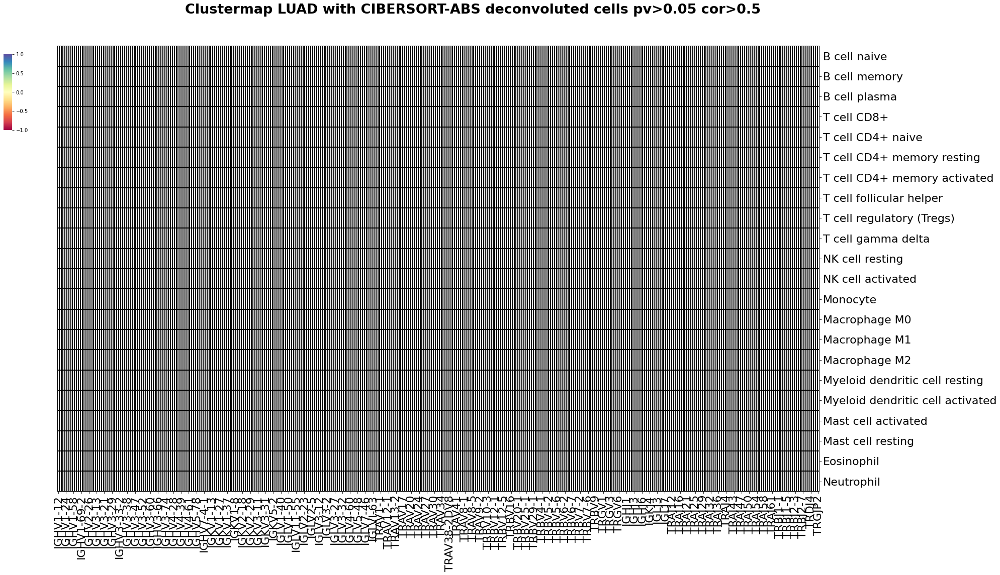

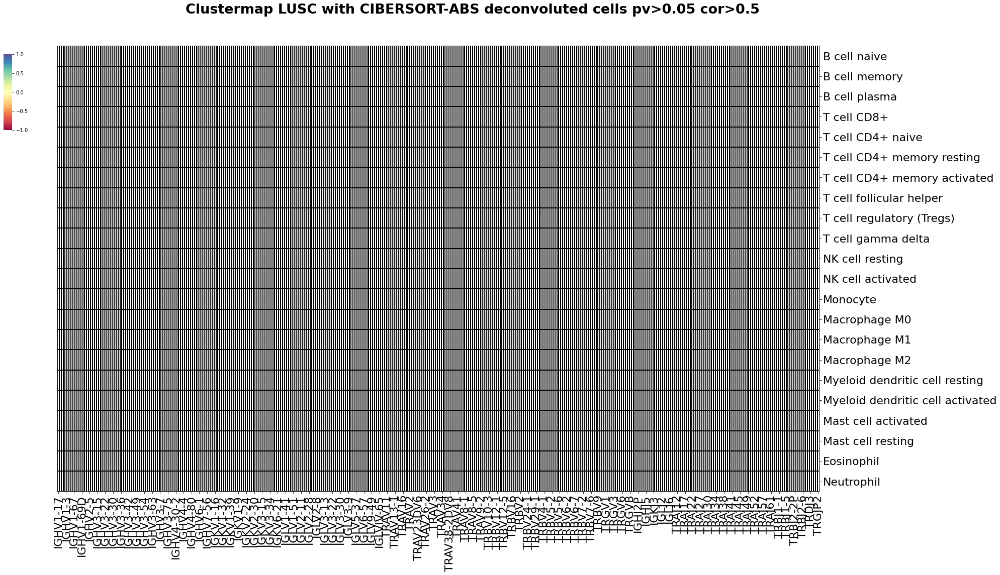

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


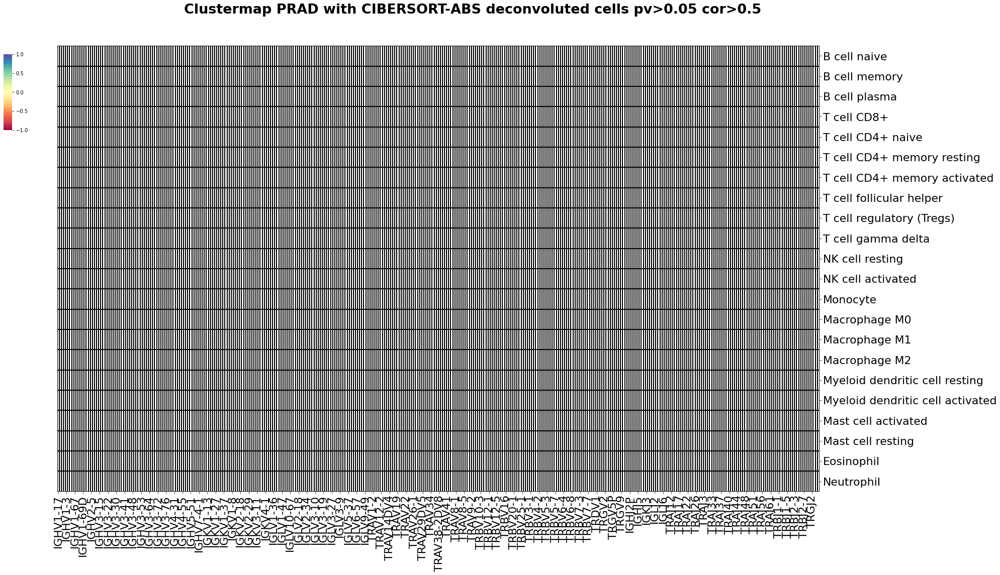

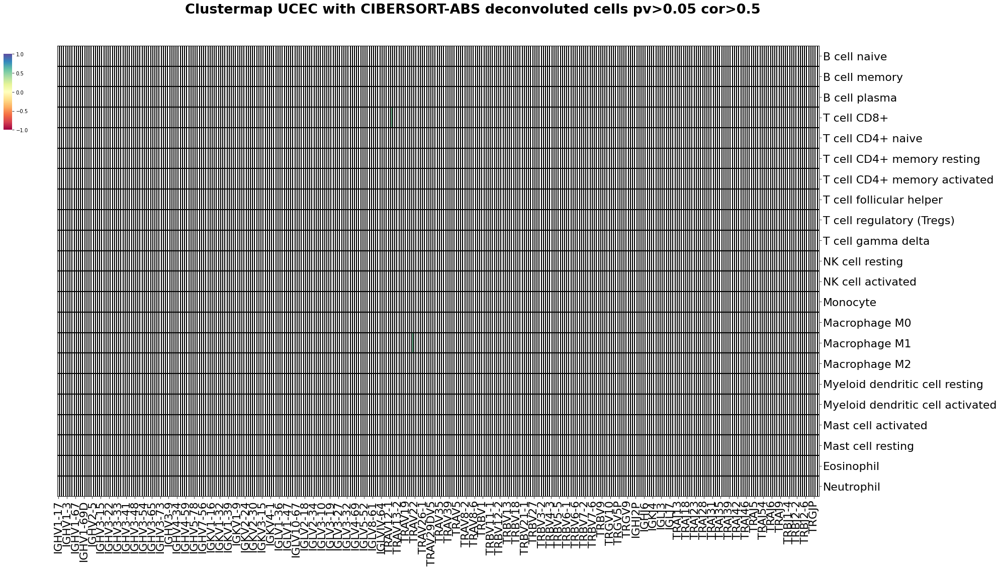

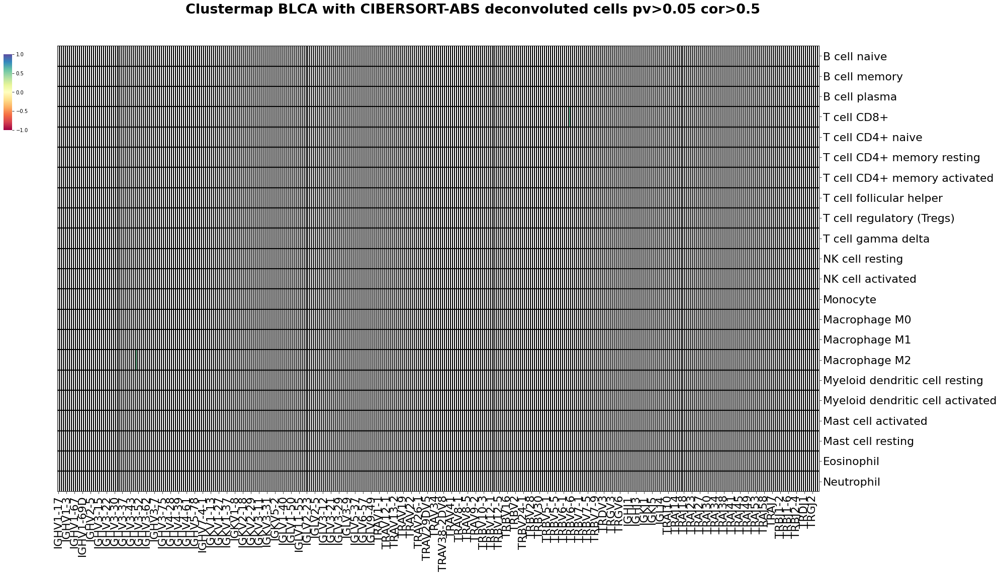

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


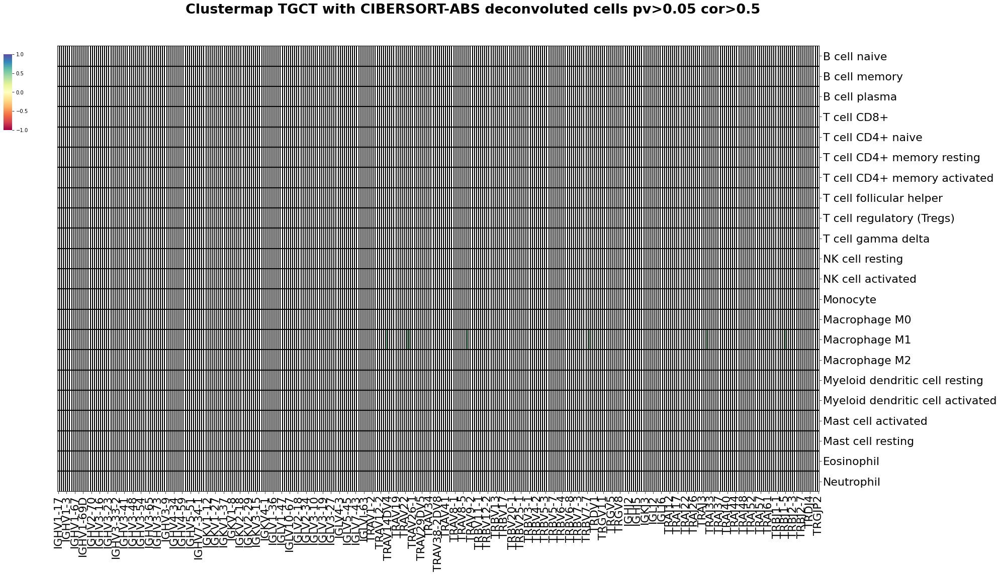

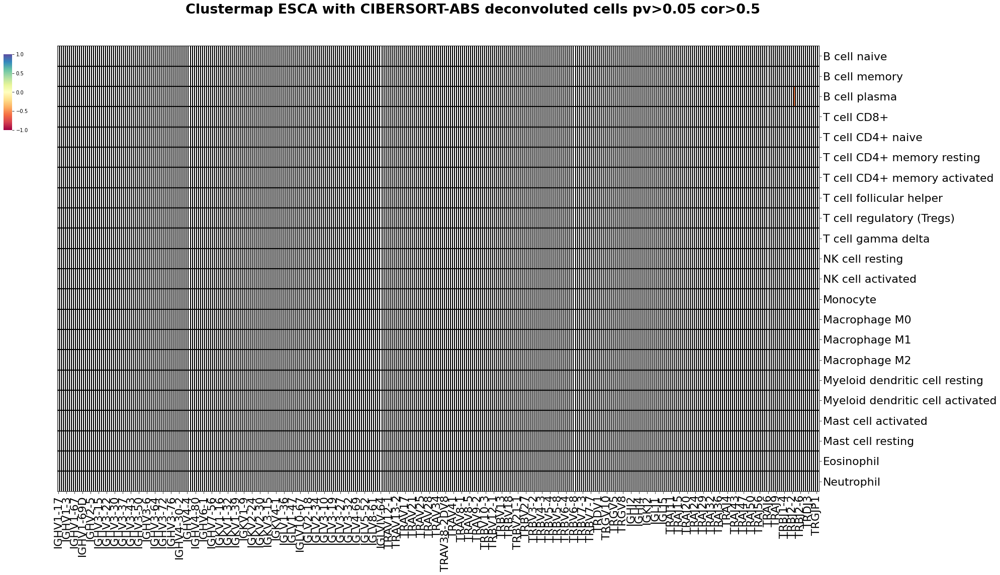

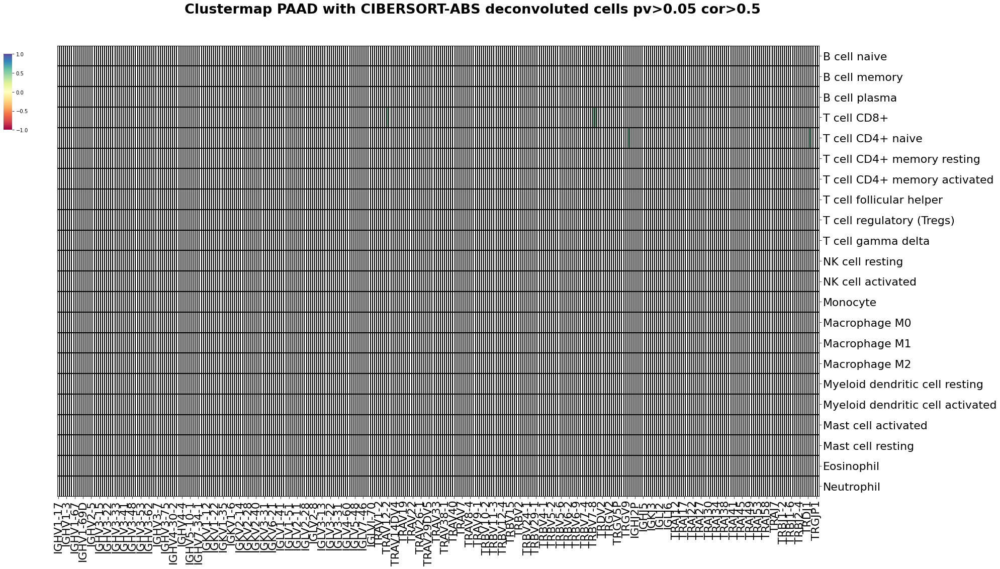

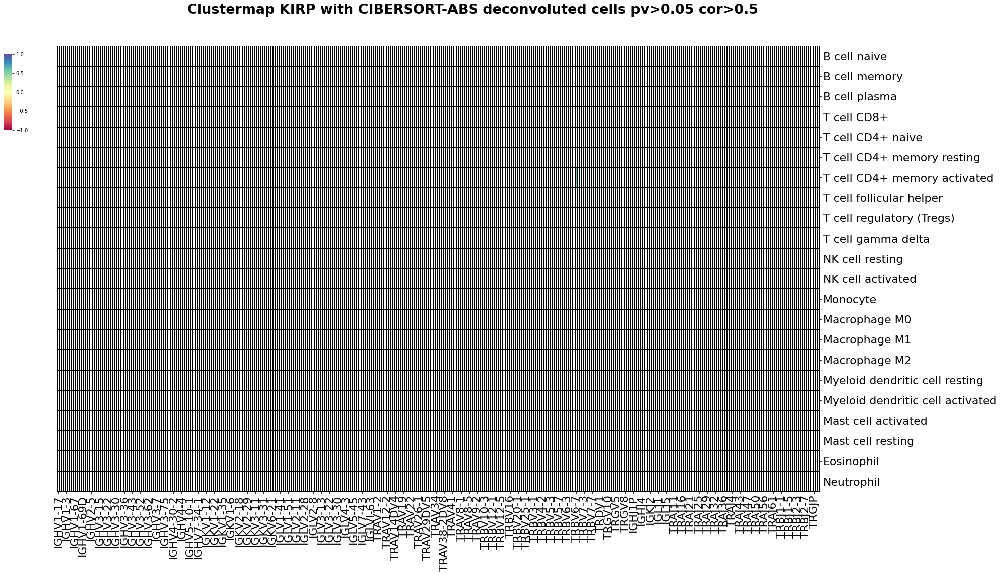

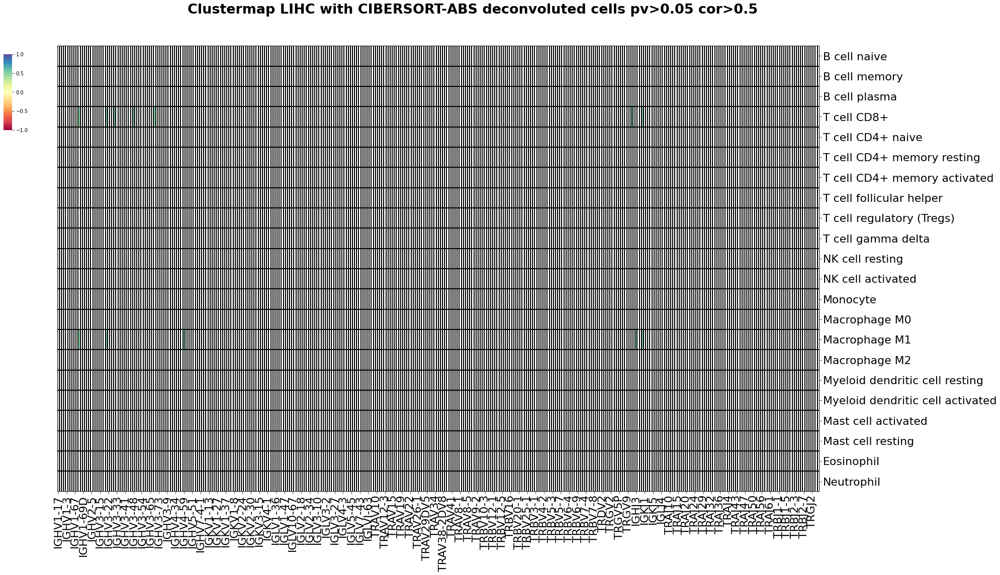

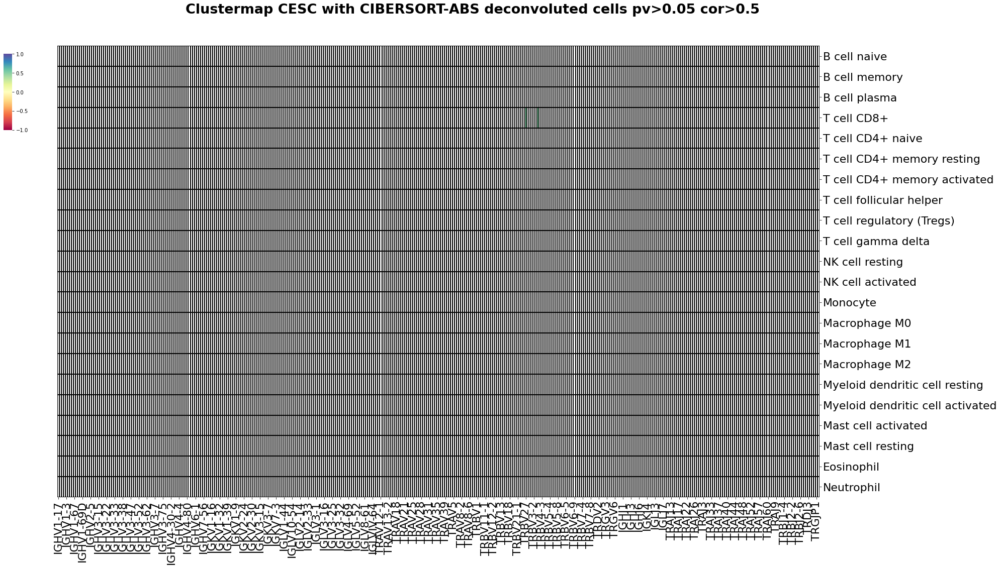

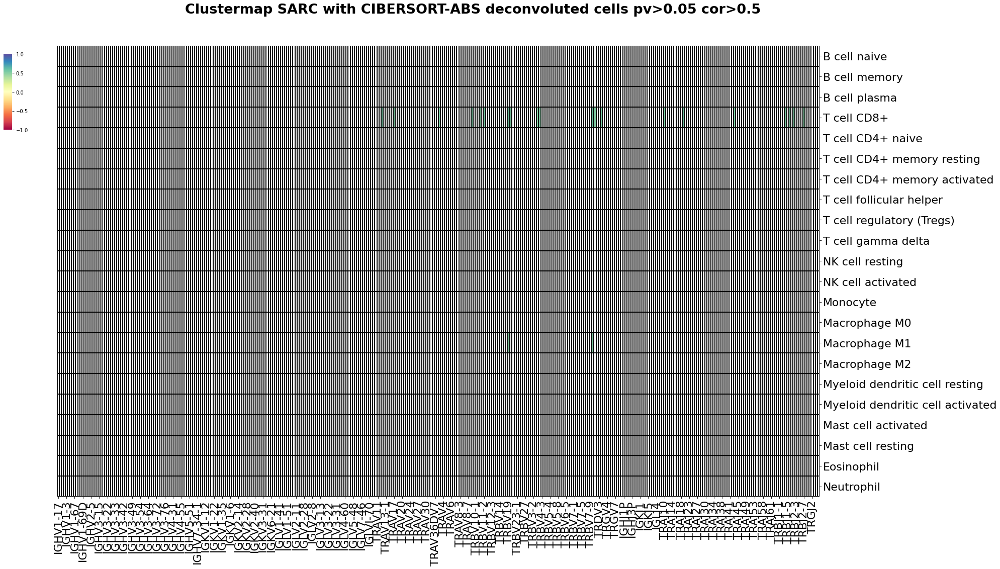

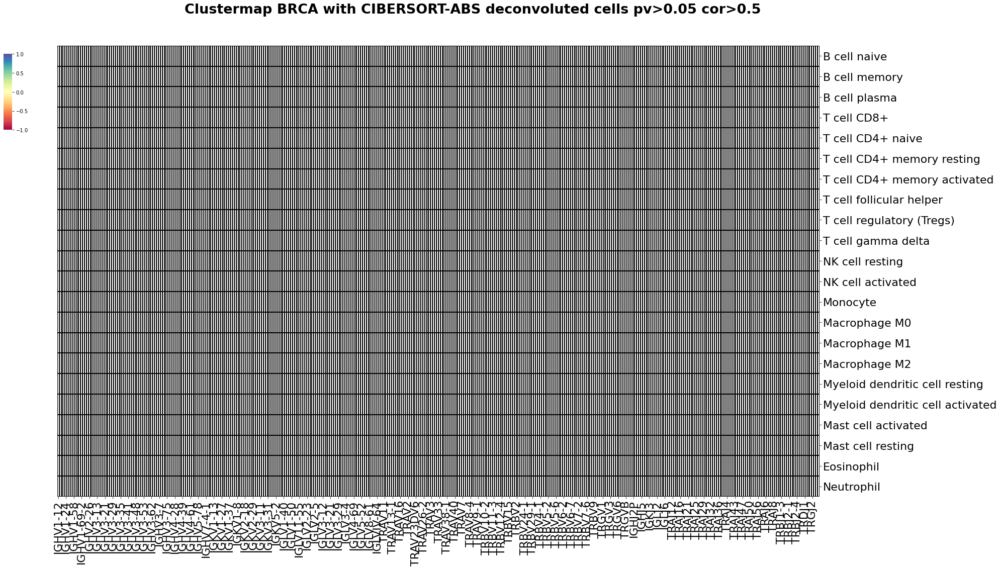

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


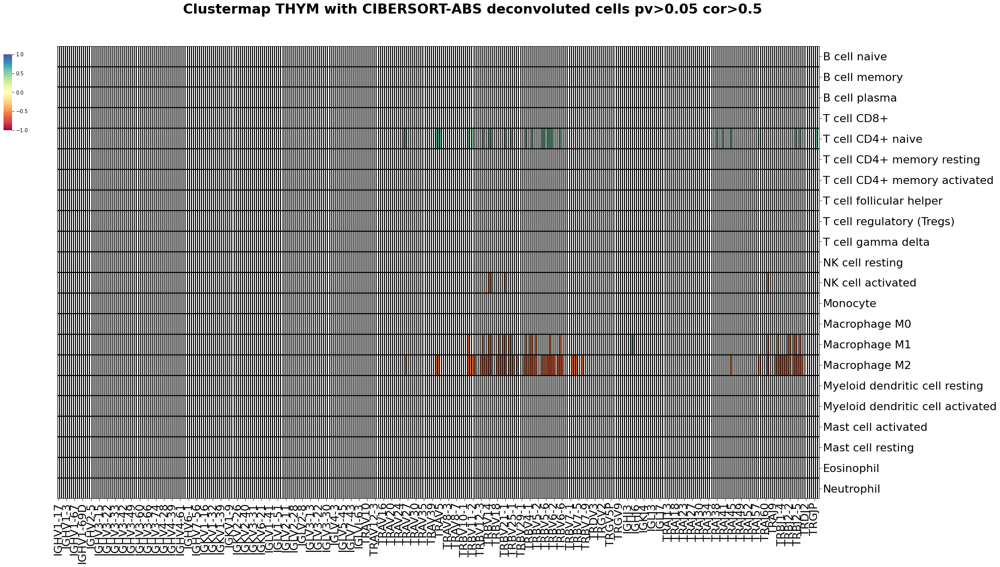

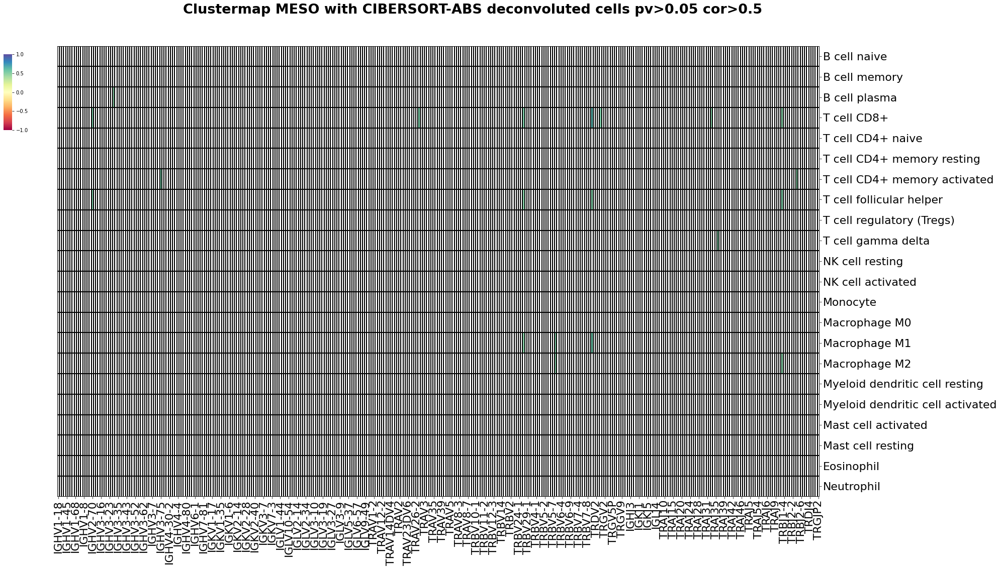

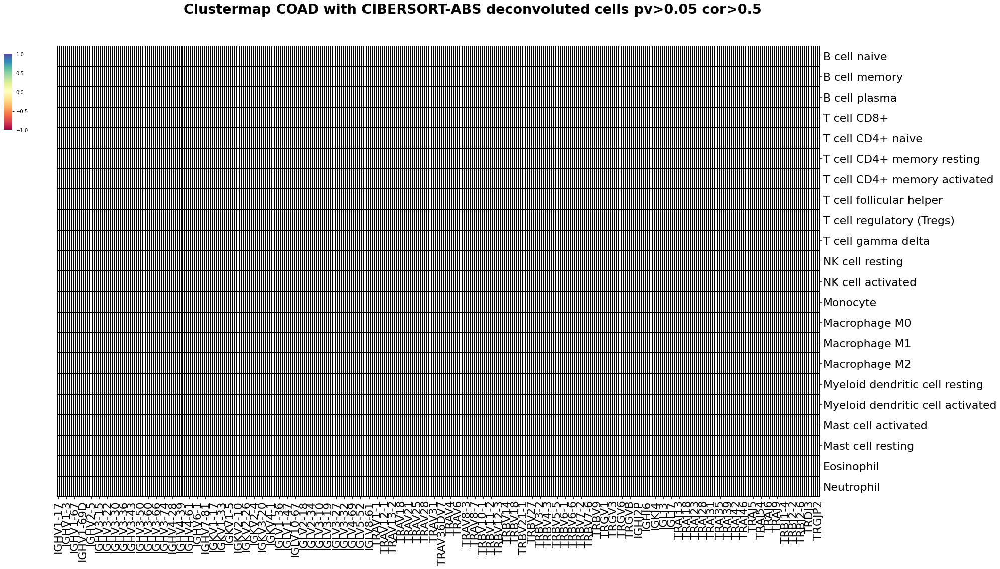

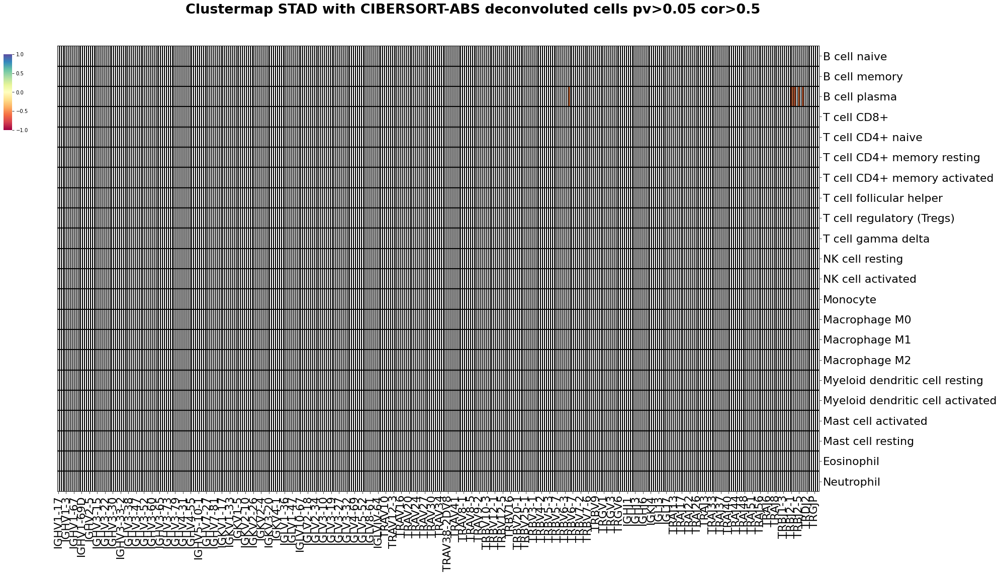

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


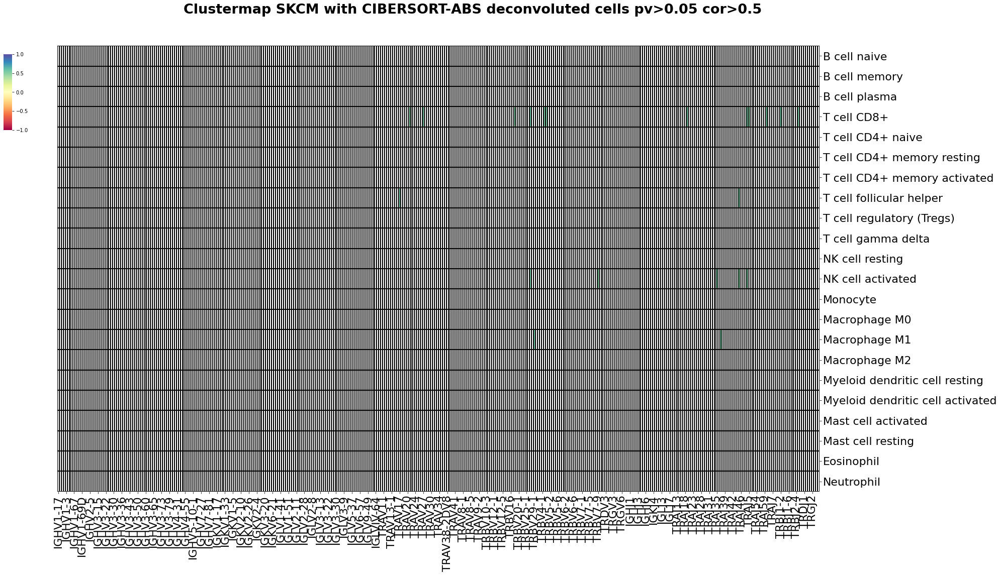

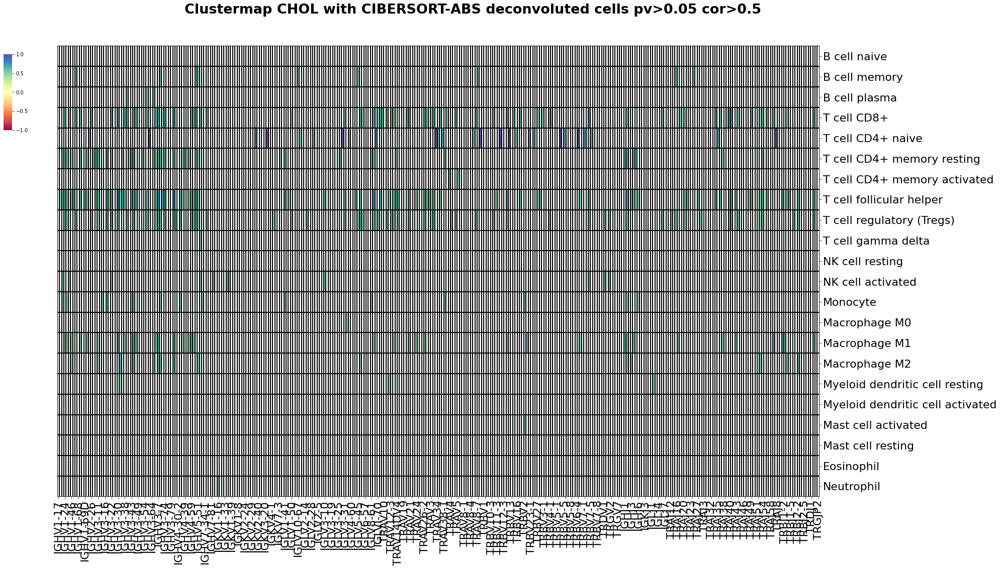

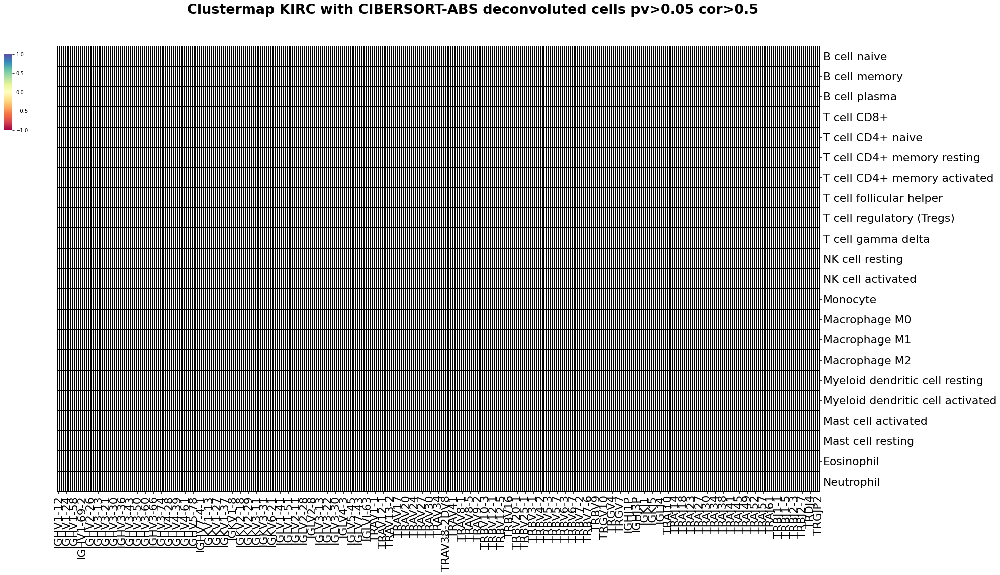

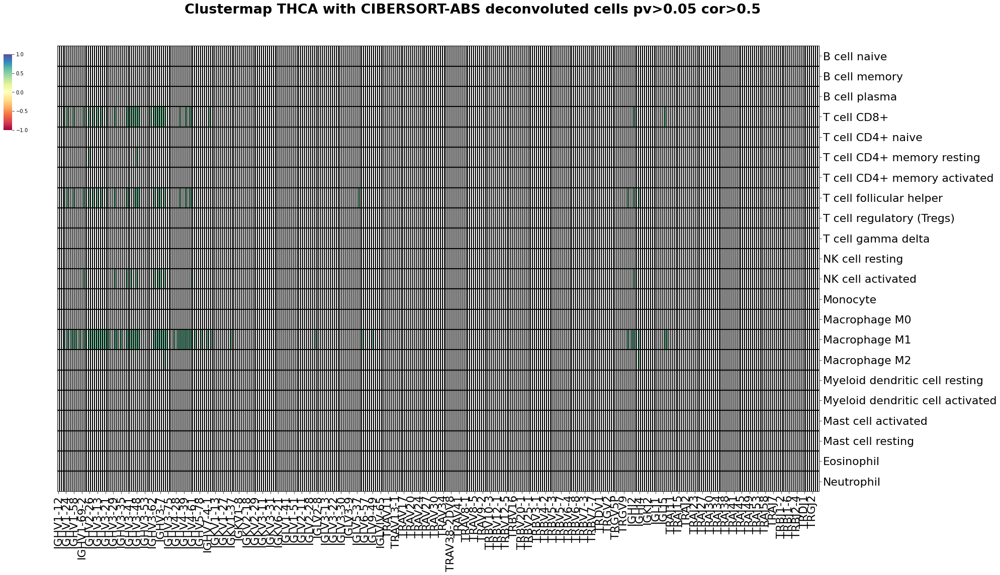

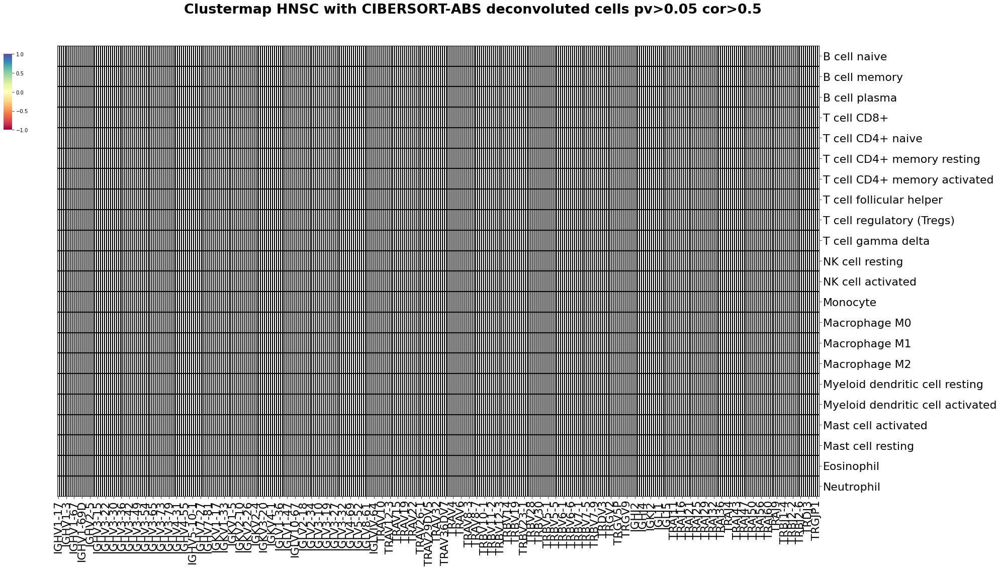

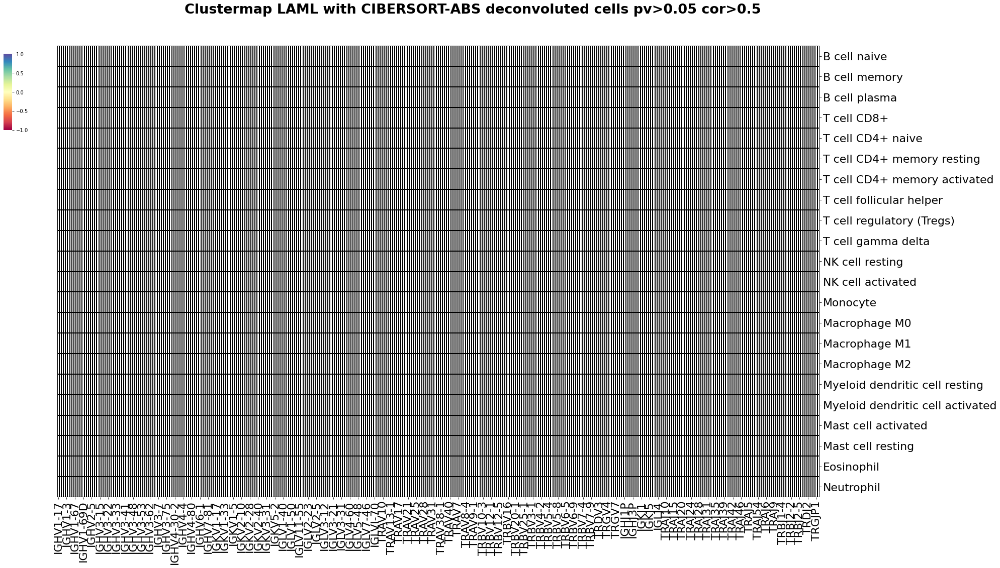

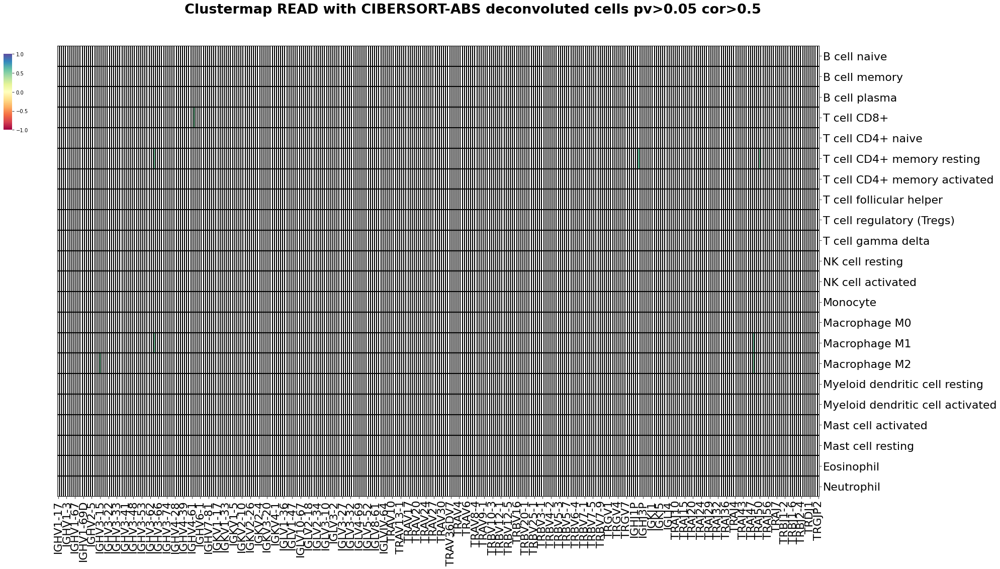

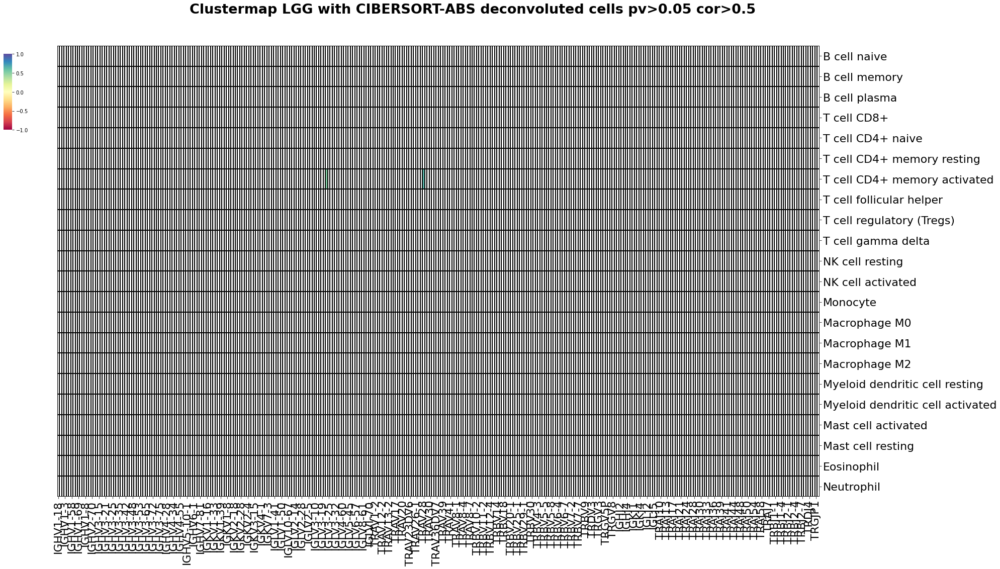

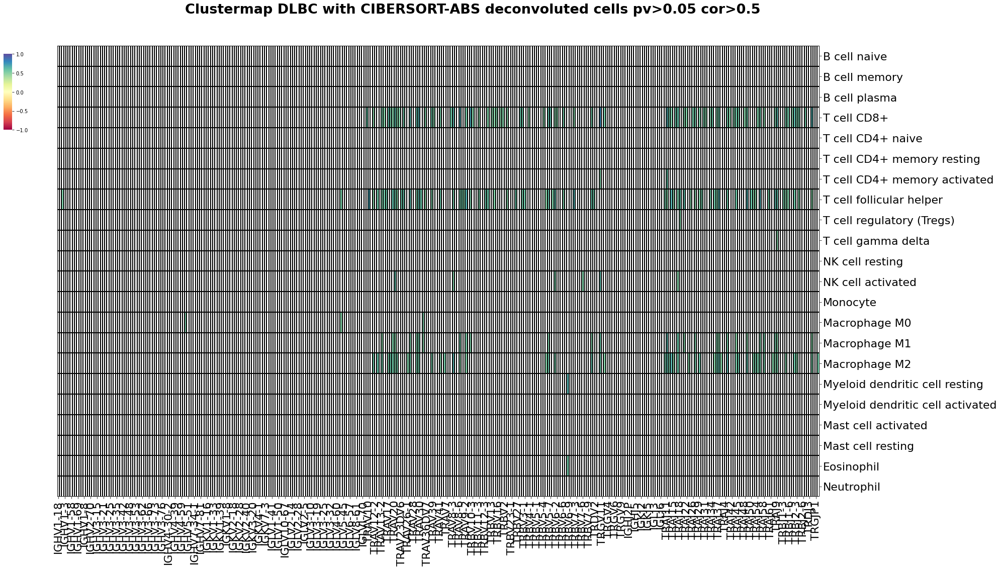

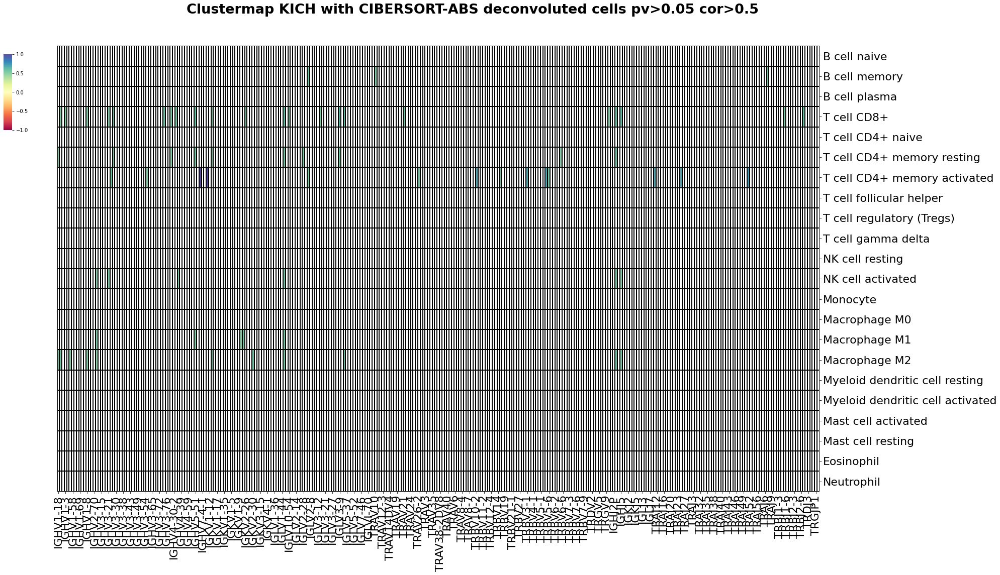

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


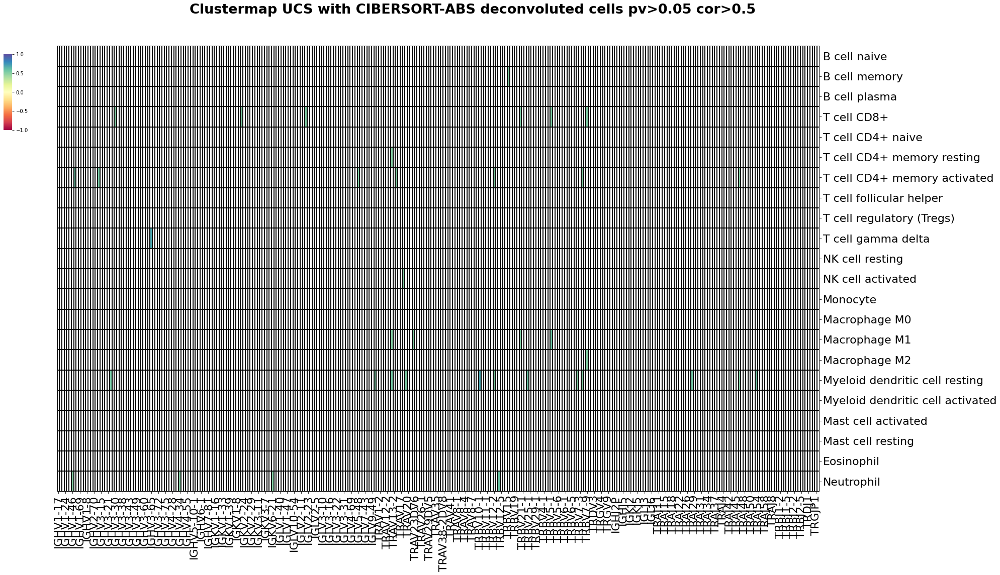

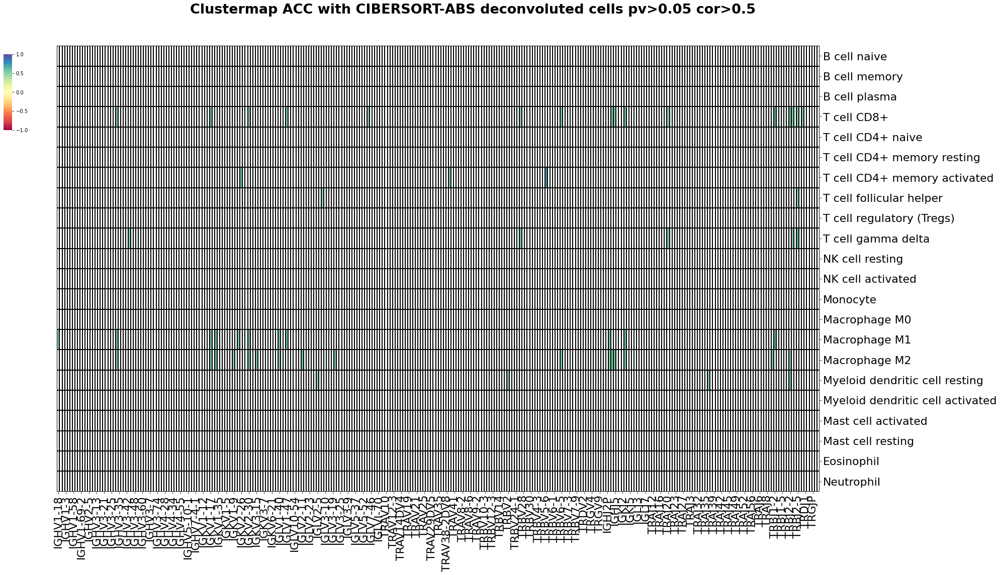

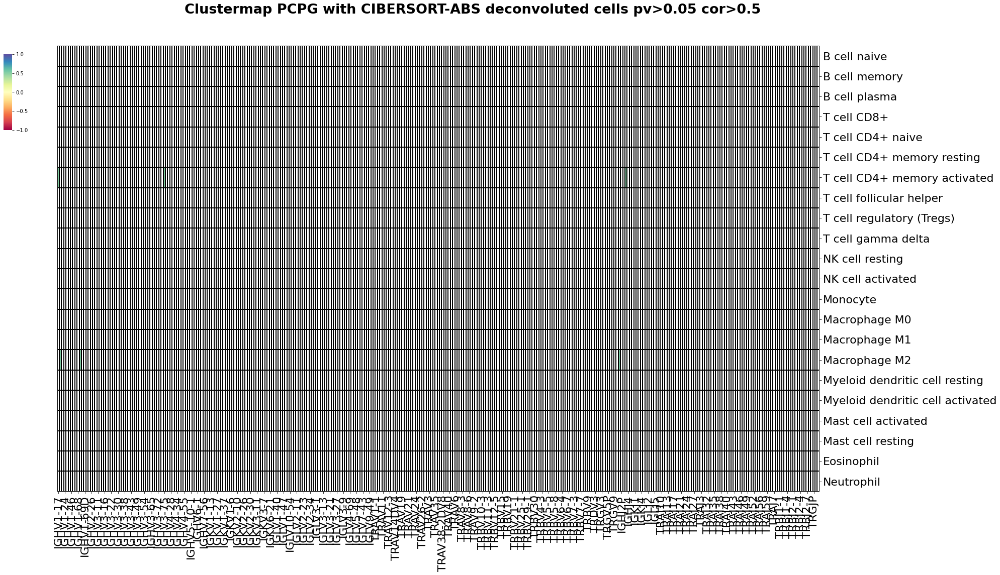

/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/dryazancev/.local/lib/python3.8/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


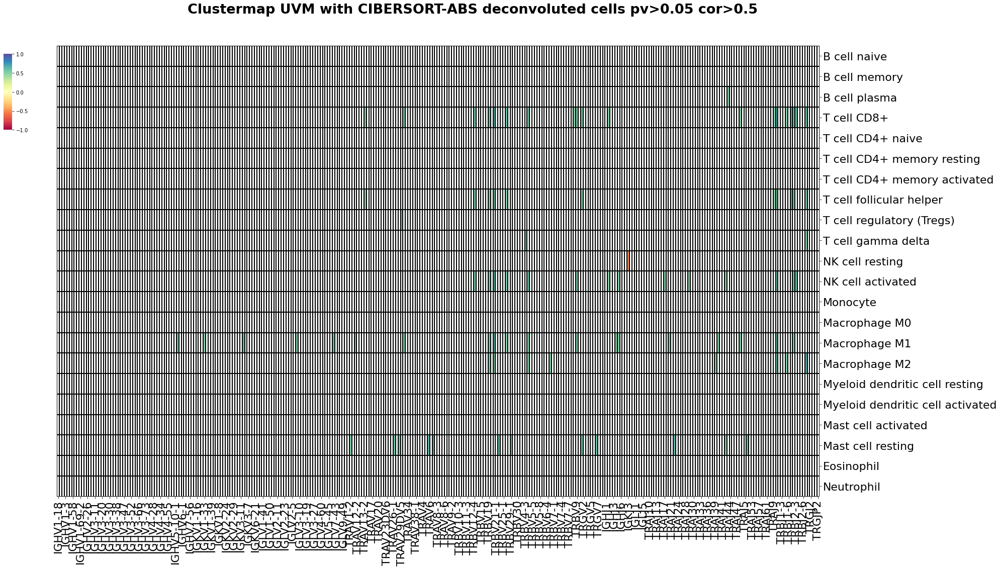

In [34]:
all_correlations = pd.DataFrame()
for cancer in cancer_types:
    tcga_type = data[data['project_id'] == cancer]
    all_corr = dec_corr_heatmap_all(cancer=tcga_type, deconvoluted=deconv, cancer_name=cancer[5:])
    all_correlations = pd.concat([all_correlations, all_corr], ignore_index=True)

In [35]:
all_correlations

,TCGA_id,Gene,Cell,Correlation
0,OV,TRAV27,T cell CD8+,0.503891
1,UCEC,TRAV21,Macrophage M1,0.519973
2,UCEC,TRAV12-2,T cell CD8+,0.500199
3,BLCA,TRBV6-5,T cell CD8+,0.548417
4,BLCA,IGHV3-49,Macrophage M2,0.508890
...,...,...,...,...
1244,UVM,TRAJ48,T cell CD8+,0.502243
1245,UVM,TRAV13-2,T cell follicular helper,0.502002
1246,UVM,TRAJ4,Macrophage M1,0.501159
1247,UVM,TRAV12-1,Macrophage M1,0.500568


In [41]:
all_correlations.to_csv("all_high_corrs_deconvs_genes-ABS.csv")

In [40]:
print(all_correlations.Correlation.max())
all_correlations.TCGA_id.unique()

1.0


array(['OV', 'UCEC', 'BLCA', 'TGCT', 'ESCA', 'PAAD', 'KIRP', 'LIHC',
       'CESC', 'SARC', 'THYM', 'MESO', 'STAD', 'SKCM', 'CHOL', 'THCA',
       'READ', 'LGG', 'DLBC', 'KICH', 'UCS', 'ACC', 'PCPG', 'UVM'],
      dtype=object)

<Axes: xlabel='Correlation', ylabel='Count'>

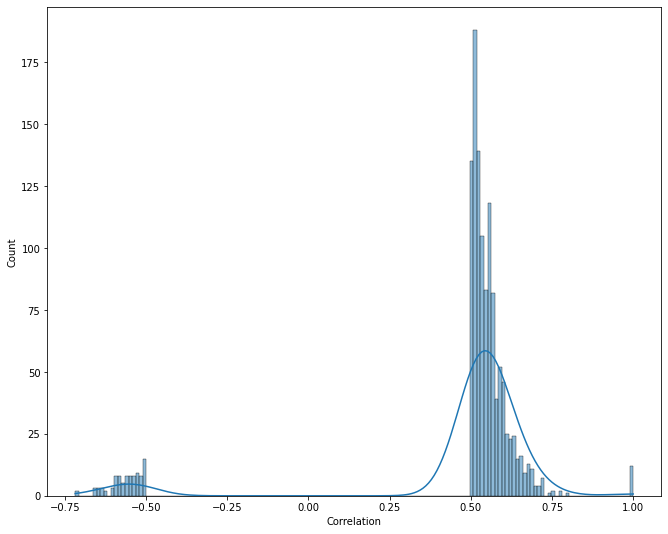

In [46]:
plt.figure(figsize=(11, 9))
sns.histplot(all_correlations.Correlation, kde=True)